# Analysis of Machine Learning and Data Science State in 2019
### Based on Kaggle 2019 Survey Data


## <a>Objective</a>
> ### *1. Analysis of the 2019 Kaggle DS & ML Survey Data*
> ### *2. Salary in 2019*
> ### *3. Salary Prediction Model*

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import MinMaxScaler

import re
import string
import math

import seaborn as sns
import matplotlib
from matplotlib import cm as cm

import matplotlib.pyplot as plt
%pylab inline
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# Suppress Warnings
import warnings
warnings.filterwarnings("ignore")

for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

Populating the interactive namespace from numpy and matplotlib
/kaggle/input/kaggle2019surveysalaryusandindia/india_salary_summary.csv
/kaggle/input/kaggle2019surveysalaryusandindia/us_salary_summary.csv
/kaggle/input/kaggle2019surveysalaryusandindia/ML Algorithms and Techniques used.png
/kaggle/input/kaggle2019surveysalaryusandindia/US Salary.png
/kaggle/input/kaggle2019surveysalaryusandindia/India Salary.png
/kaggle/input/kaggle2019surveysalaryusandindia/encoded_salary_data.csv
/kaggle/input/kaggle2019surveysalaryusandindia/Course Preference.png
/kaggle/input/kaggle-survey-2019/questions_only.csv
/kaggle/input/kaggle-survey-2019/multiple_choice_responses.csv
/kaggle/input/kaggle-survey-2019/other_text_responses.csv
/kaggle/input/kaggle-survey-2019/survey_schema.csv


In [2]:
pd.set_option('max_rows',500)
pd.set_option('max_columns',800)

In [3]:
dirname = '../input/kaggle-survey-2019'
survey = pd.read_csv(dirname +'/multiple_choice_responses.csv')
#text = pd.read_csv(dirname+'/other_text_responses.csv')
questions = pd.read_csv(dirname+'/questions_only.csv')
#survey = pd.read_csv(dirname+'/survey_schema.csv')

In [4]:
survey= survey.drop([0], errors='ignore')

# <a><font color="#eeaa00">1. The State of ML and DS in 2019</font></a>

In [5]:
survey.head(1)

,Time from Start to Finish (seconds),Q1,Q2,Q2_OTHER_TEXT,Q3,Q4,Q5,Q5_OTHER_TEXT,Q6,Q7,Q8,Q9_Part_1,Q9_Part_2,Q9_Part_3,Q9_Part_4,Q9_Part_5,Q9_Part_6,Q9_Part_7,Q9_Part_8,Q9_OTHER_TEXT,Q10,Q11,Q12_Part_1,Q12_Part_2,Q12_Part_3,Q12_Part_4,Q12_Part_5,Q12_Part_6,Q12_Part_7,Q12_Part_8,Q12_Part_9,Q12_Part_10,Q12_Part_11,Q12_Part_12,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_OTHER_TEXT,Q14,Q14_Part_1_TEXT,Q14_Part_2_TEXT,Q14_Part_3_TEXT,Q14_Part_4_TEXT,Q14_Part_5_TEXT,Q14_OTHER_TEXT,Q15,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_OTHER_TEXT,Q17_Part_1,Q17_Part_2,Q17_Part_3,Q17_Part_4,Q17_Part_5,Q17_Part_6,Q17_Part_7,Q17_Part_8,Q17_Part_9,Q17_Part_10,Q17_Part_11,Q17_Part_12,Q17_OTHER_TEXT,Q18_Part_1,Q18_Part_2,Q18_Part_3,Q18_Part_4,Q18_Part_5,Q18_Part_6,Q18_Part_7,Q18_Part_8,Q18_Part_9,Q18_Part_10,Q18_Part_11,Q18_Part_12,Q18_OTHER_TEXT,Q19,Q19_OTHER_TEXT,Q20_Part_1,Q20_Part_2,Q20_Part_3,Q20_Part_4,Q20_Part_5,Q20_Part_6,Q20_Part_7,Q20_Part_8,Q20_Part_9,Q20_Part_10,Q20_Part_11,Q20_Part_12,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_OTHER_TEXT,Q22,Q23,Q24_Part_1,Q24_Part_2,Q24_Part_3,Q24_Part_4,Q24_Part_5,Q24_Part_6,Q24_Part_7,Q24_Part_8,Q24_Part_9,Q24_Part_10,Q24_Part_11,Q24_Part_12,Q24_OTHER_TEXT,Q25_Part_1,Q25_Part_2,Q25_Part_3,Q25_Part_4,Q25_Part_5,Q25_Part_6,Q25_Part_7,Q25_Part_8,Q25_OTHER_TEXT,Q26_Part_1,Q26_Part_2,Q26_Part_3,Q26_Part_4,Q26_Part_5,Q26_Part_6,Q26_Part_7,Q26_OTHER_TEXT,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32_Part_1,Q32_Part_2,Q32_Part_3,Q32_Part_4,Q32_Part_5,Q32_Part_6,Q32_Part_7,Q32_Part_8,Q32_Part_9,Q32_Part_10,Q32_Part_11,Q32_Part_12,Q32_OTHER_TEXT,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_Part_12,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_Part_7,Q34_Part_8,Q34_Part_9,Q34_Part_10,Q34_Part_11,Q34_Part_12,Q34_OTHER_TEXT
1,510,22-24,Male,-1,France,Master’s degree,Software Engineer,-1,"1000-9,999 employees",0,I do not know,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,"30,000-39,999",$0 (USD),Twitter (data science influencers),NaN,NaN,"Kaggle (forums, blog, social media, etc)",NaN,NaN,NaN,"Blogs (Towards Data Science, Medium, Analytics...",Journal Publications (traditional publications...,NaN,NaN,NaN,-1,NaN,Coursera,NaN,DataCamp,NaN,Kaggle Courses (i.e. Kaggle Learn),NaN,Udemy,NaN,NaN,NaN,NaN,-1,"Basic statistical software (Microsoft Excel, G...",0,-1,-1,-1,-1,-1,1-2 years,"Jupyter (JupyterLab, Jupyter Notebooks, etc)",RStudio,PyCharm,NaN,MATLAB,NaN,Spyder,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,Python,R,SQL,NaN,NaN,Java,Javascript,NaN,NaN,MATLAB,NaN,NaN,-1,Python,-1,NaN,Matplotlib,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,CPUs,GPUs,NaN,NaN,NaN,-1,Never,1-2 years,Linear or Logistic Regression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1,NaN,NaN,NaN,NaN,NaN,NaN,N

In [6]:
survey.columns = ['Duration','Age','Gender','Gender_Text','Country','Education','Role','Role_Text',
                  'Company_Size','DS_Team_Size','ML_in_Business',
                  'Role_Analyze_Data','Role_Build_Data_Infra','Role_Build_Prototype','Role_ML_Service',
                  'Role_ML_Experimentation','Role_ML_Research','Role_ML_None','Role_ML_Other','Role_Text',
                  'Salary','ML_Spend',
                  'Media_Twitter','Media_HackerNews','Media_Reddit','Media_Kaggle','Media_CourseForums','Media_YouTube',
                  'Media_Podcasts','Media_Blogs','Media_Journal','Media_Slack','Media_None','Media_Other','Media_Text',
                  'Course_Udacity','Course_Coursera','Course_edX','Course_DataCamp','Course_DataQuest','Course_Kaggle',
                  'Course_Fastai','Course_Udemy','Course_Linkedin','Course_University','Course_None','Course_Other','Course_Text',
                  'Data_Analysis_Response','Data_Analysis_Basic','Data_Analysis_Advanced','Data_Analysis_BI',
                  'Data_Analysis_Local','Data_Analysis_Cloud','Data_Analysis_Other',
                  'Writing_Code',
                  'IDE_Jupyter','IDE_RStudio','IDE_PyCharm','IDE_Atom','IDE_MATLAB','IDE_VS','IDE_Spyder',
                  'IDE_Vim','IDE_Notepad++','IDE_Sublime','IDE_None','IDE_Other','IDE_Text',
                  'Notebook_Kaggle','Notebook_Google_Colab','Notebook_MS_Azure','Notebook_Google_Cloud',
                  'Notebook_Paperspace','Notebook_FloydHub','Notebook_Binder','Notebook_IBM_Watson',
                  'Notebook_Code_Ocean','Notebook_AWS','Notebook_None','Notebook_Other','Notebook_Text',
                  'Language_Python','Language_R','Language_SQL','Language_C','Language_C++','Language_Java','Language_Javascript',
                  'Language_TypeScript','Language_Bash','Language_MATLAB','Language_None','Language_Other','Language_Text',
                  'Recommended_Language','Recommended_Language_Other',
                  'Vis_Ggplot','Vis_Matplotlib','Vis_Altair','Vis_Shiny','Vis_D3','Vis_Plotly','Vis_Bokeh','Vis_Seaborn',
                  'Vis_Geoplotlib','Vis_Leaflet','Vis_None','Vis_Other','Vis_Text',
                  'CPU','GPU','TPU','Hardware_None','Hardware_Other','Hardware_Text','TPU_Usage','ML_Since',
                  'Algorithm_Regression','Algorithm_Tree','Algorithm_GBM','Algorithm_Bayesian',
                  'Algorithm_Evolutionary','Algorithm_DNN','Algorithm_CNN','Algorithm_GAN','Algorithm_RNN','Algorithm_Transformer',
                  'Algorithm_None','Algorithm_Other','Algorithm_Text',
                  'Auto_Augmentation','Auto_Feature_Engineering','Auto_Model_Selection','Auto_Model_Architecture',
                  'Auto_Hyperparameter_Tuning','Auto_Pipeline','Auto_None','Auto_Other','Auto_Text',
                  'CV_General','CV_Image_Segmentation','CV_Object_Detection','CV_Image_Classification',
                  'CV_GAN','CV_None','CV_Other','CV_Text',
                  'NLP_Embeddings','NLP_Encoder','NLP_Contextualized_Embeddings','NLP_Transformer',
                  'NLP_None','NLP_Other','NLP_Text',
                  'ML_Scikit-learn','ML_Tensorflow','ML_Keras','ML_RandomForest','ML_Xgboost','ML_PyTorch',
                  'ML_Caret','ML_LightGBM','ML_SparkMLib','ML_Fastai','ML_None','ML_Other','ML_Text',
                  'Cloud_Platform_GCP','Cloud_Platform_AWS','Cloud_Platform_Azure','Cloud_Platform_IBM','Cloud_Platform_Alibaba',
                  'Cloud_Platform_Salesforce','Cloud_Platform_Oracle','Cloud_Platform_SAP','Cloud_Platform_VMware',
                  'Cloud_Platform_RedHat','Cloud_Platform_None','Cloud_Platform_Other','Cloud_Platform_Text',
                  'Cloud_Product_AWS_EC2','Cloud_Product_Google_ComputeEngine','Cloud_Product_AWS_Lambda',
                  'Cloud_Product_Azure_VM','Cloud_Product_Google_AppEngine','Cloud_Product_Google_CloudFunctions',
                  'Cloud_Product_AWS_EBS','Cloud_Product_Google_Kubernetes','Cloud_Product_AWS_Batch',
                  'Cloud_Product_Azure_Container','Cloud_Product_None','Cloud_Product_Other','Cloud_Product_Text',
                  'BigData_Google_BigQuery','BigData_AWS_Redshift','BigData_Google_Databricks','BigData_AWS_EMR',
                  'BigData_Teradata','BigData_MSAS','BigData_Google_CloudDataflow','BigData_AWS_Athena',
                  'BigData_AWS_Kinesis','BigData_Google_CloudPub','BigData_None','BigData_Other','BigData_Text',
                  'ML_Product_SAS','ML_Product_Cloudera','ML_Product_Azure_Studio','ML_Product_Google_Cloud_MLEngine',
                  'ML_Product_Google_Cloud_Vision','ML_Product_Google_SpeechtoText','ML_Product_Google_Cloud_NaturalLanguage',
                  'ML_Product_Rapidminer','ML_Product_Google_Cloud_Translation','ML_Product_AWS_Sagemaker',
                  'ML_Product_None','ML_Product_Other','ML_Product_Text',
                  'AutoML_Google','AutoML_H2O','AutoML_Databricks','AutoML_DataRobot','AutoML_Tpot',
                  'AutoML_Auto-Keras','AutoML_Auto-Sklearn','AutoML_Auto_ml','AutoML_Xcessiv','AutoML_MLbox',
                  'AutoML_None','AutoML_Other','AutoML_Text',
                  'RDB_MySQL','RDB_PostgresSQL','RDB_SQLite','RDB_MS_SQLServer','RDB_Oracle','RDB_MS_Access','RDB_AWS_RDS',
                  'RDB_AWS_DynamoDB','RDB_Azure_SQL','RDB_Google_CloudSQL','RDB_None','RDB_Other','RDB_Text']

In [7]:
dfcols = ['Duration','Age','Gender','Country','Education','Role',
                  'Company_Size','DS_Team_Size','ML_in_Business',
                  'Role_Analyze_Data','Role_Build_Data_Infra','Role_Build_Prototype','Role_ML_Service',
                  'Role_ML_Experimentation','Role_ML_Research','Role_ML_None','Role_ML_Other',
                  'Salary','ML_Spend',
                  'Media_Twitter','Media_HackerNews','Media_Reddit','Media_Kaggle','Media_CourseForums','Media_YouTube',
                  'Media_Podcasts','Media_Blogs','Media_Journal','Media_Slack','Media_None','Media_Other',
                  'Course_Udacity','Course_Coursera','Course_edX','Course_DataCamp','Course_DataQuest','Course_Kaggle',
                  'Course_Fastai','Course_Udemy','Course_Linkedin','Course_University','Course_None','Course_Other',
                  'Data_Analysis_Response','Data_Analysis_Basic','Data_Analysis_Advanced','Data_Analysis_BI',
                  'Data_Analysis_Local','Data_Analysis_Cloud','Data_Analysis_Other',
                  'Writing_Code',
                  'IDE_Jupyter','IDE_RStudio','IDE_PyCharm','IDE_Atom','IDE_MATLAB','IDE_VS','IDE_Spyder',
                  'IDE_Vim','IDE_Notepad++','IDE_Sublime','IDE_None','IDE_Other',
                  'Notebook_Kaggle','Notebook_Google_Colab','Notebook_MS_Azure','Notebook_Google_Cloud',
                  'Notebook_Paperspace','Notebook_FloydHub','Notebook_Binder','Notebook_IBM_Watson',
                  'Notebook_Code_Ocean','Notebook_AWS','Notebook_None','Notebook_Other',
                  'Language_Python','Language_R','Language_SQL','Language_C','Language_C++','Language_Java','Language_Javascript',
                  'Language_TypeScript','Language_Bash','Language_MATLAB','Language_None','Language_Other',
                  'Recommended_Language','Recommended_Language_Other',
                  'Vis_Ggplot','Vis_Matplotlib','Vis_Altair','Vis_Shiny','Vis_D3','Vis_Plotly','Vis_Bokeh','Vis_Seaborn',
                  'Vis_Geoplotlib','Vis_Leaflet','Vis_None','Vis_Other',
                  'CPU','GPU','TPU','Hardware_None','Hardware_Other','TPU_Usage','ML_Since',
                  'Algorithm_Regression','Algorithm_Tree','Algorithm_GBM','Algorithm_Bayesian',
                  'Algorithm_Evolutionary','Algorithm_DNN','Algorithm_CNN','Algorithm_GAN','Algorithm_RNN','Algorithm_Transformer',
                  'Algorithm_None','Algorithm_Other',
                  'Auto_Augmentation','Auto_Feature_Engineering','Auto_Model_Selection','Auto_Model_Architecture',
                  'Auto_Hyperparameter_Tuning','Auto_Pipeline','Auto_None','Auto_Other',
                  'CV_General','CV_Image_Segmentation','CV_Object_Detection','CV_Image_Classification',
                  'CV_GAN','CV_None','CV_Other',
                  'NLP_Embeddings','NLP_Encoder','NLP_Contextualized_Embeddings','NLP_Transformer',
                  'NLP_None','NLP_Other',
                  'ML_Scikit-learn','ML_Tensorflow','ML_Keras','ML_RandomForest','ML_Xgboost','ML_PyTorch',
                  'ML_Caret','ML_LightGBM','ML_SparkMLib','ML_Fastai','ML_None','ML_Other',
                  'Cloud_Platform_GCP','Cloud_Platform_AWS','Cloud_Platform_Azure','Cloud_Platform_IBM','Cloud_Platform_Alibaba',
                  'Cloud_Platform_Salesforce','Cloud_Platform_Oracle','Cloud_Platform_SAP','Cloud_Platform_VMware',
                  'Cloud_Platform_RedHat','Cloud_Platform_None','Cloud_Platform_Other',
                  'Cloud_Product_AWS_EC2','Cloud_Product_Google_ComputeEngine','Cloud_Product_AWS_Lambda',
                  'Cloud_Product_Azure_VM','Cloud_Product_Google_AppEngine','Cloud_Product_Google_CloudFunctions',
                  'Cloud_Product_AWS_EBS','Cloud_Product_Google_Kubernetes','Cloud_Product_AWS_Batch',
                  'Cloud_Product_Azure_Container','Cloud_Product_None','Cloud_Product_Other',
                  'BigData_Google_BigQuery','BigData_AWS_Redshift','BigData_Google_Databricks','BigData_AWS_EMR',
                  'BigData_Teradata','BigData_MSAS','BigData_Google_CloudDataflow','BigData_AWS_Athena',
                  'BigData_AWS_Kinesis','BigData_Google_CloudPub','BigData_None','BigData_Other',
                  'ML_Product_SAS','ML_Product_Cloudera','ML_Product_Azure_Studio','ML_Product_Google_Cloud_MLEngine',
                  'ML_Product_Google_Cloud_Vision','ML_Product_Google_SpeechtoText','ML_Product_Google_Cloud_NaturalLanguage',
                  'ML_Product_Rapidminer','ML_Product_Google_Cloud_Translation','ML_Product_AWS_Sagemaker',
                  'ML_Product_None','ML_Product_Other',
                  'AutoML_Google','AutoML_H2O','AutoML_Databricks','AutoML_DataRobot','AutoML_Tpot',
                  'AutoML_Auto-Keras','AutoML_Auto-Sklearn','AutoML_Auto_ml','AutoML_Xcessiv','AutoML_MLbox',
                  'AutoML_None','AutoML_Other',
                  'RDB_MySQL','RDB_PostgresSQL','RDB_SQLite','RDB_MS_SQLServer','RDB_Oracle','RDB_MS_Access','RDB_AWS_RDS',
                  'RDB_AWS_DynamoDB','RDB_Azure_SQL','RDB_Google_CloudSQL','RDB_None','RDB_Other']

In [8]:
df = survey[dfcols].copy()

In [9]:
def binary_encoding(bin_var):
    """ Function to encode binary valued variables """
    lb = LabelEncoder()
    bin_var = bin_var.fillna('')
    bin_var = lb.fit_transform(bin_var)
    #print('Max Value ',bin_var.max())
    return bin_var

In [10]:
df['Role_Analyze_Data'] = binary_encoding(df['Role_Analyze_Data'])
df['Role_Build_Data_Infra'] = binary_encoding(df['Role_Build_Data_Infra'])
df['Role_Build_Prototype'] = binary_encoding(df['Role_Build_Prototype'])
df['Role_ML_Service'] = binary_encoding(df['Role_ML_Service'])
df['Role_ML_Experimentation'] = binary_encoding(df['Role_ML_Experimentation'])
df['Role_ML_Research'] = binary_encoding(df['Role_ML_Research'])
df['Media_Twitter'] = binary_encoding(df['Media_Twitter'])
df['Media_HackerNews'] = binary_encoding(df['Media_HackerNews'])
df['Media_Reddit'] = binary_encoding(df['Media_Reddit'])
df['Media_Kaggle'] = binary_encoding(df['Media_Kaggle'])
df['Media_CourseForums'] = binary_encoding(df['Media_CourseForums'])
df['Media_YouTube'] = binary_encoding(df['Media_YouTube'])
df['Media_Podcasts'] = binary_encoding(df['Media_Podcasts'])
df['Media_Blogs'] = binary_encoding(df['Media_Blogs'])
df['Media_Journal'] = binary_encoding(df['Media_Journal'])
df['Media_Slack'] = binary_encoding(df['Media_Slack'])
df['Course_Udacity'] = binary_encoding(df['Course_Udacity'])
df['Course_Coursera'] = binary_encoding(df['Course_Coursera'])
df['Course_edX'] = binary_encoding(df['Course_edX'])
df['Course_DataCamp'] = binary_encoding(df['Course_DataCamp'])
df['Course_DataQuest'] = binary_encoding(df['Course_DataQuest'])
df['Course_Kaggle'] = binary_encoding(df['Course_Kaggle'])
df['Course_Fastai'] = binary_encoding(df['Course_Fastai'])
df['Course_Udemy'] = binary_encoding(df['Course_Udemy'])
df['Course_Linkedin'] = binary_encoding(df['Course_Linkedin'])
df['Course_University'] = binary_encoding(df['Course_University'])
df['Algorithm_Regression'] = binary_encoding(df['Algorithm_Regression'])
df['Algorithm_Tree'] = binary_encoding(df['Algorithm_Tree'])
df['Algorithm_GBM'] = binary_encoding(df['Algorithm_GBM'])
df['Algorithm_Bayesian'] = binary_encoding(df['Algorithm_Bayesian'])
df['Algorithm_Evolutionary'] = binary_encoding(df['Algorithm_Evolutionary'])
df['Algorithm_DNN'] = binary_encoding(df['Algorithm_DNN'])
df['Algorithm_CNN'] = binary_encoding(df['Algorithm_CNN'])
df['Algorithm_GAN'] = binary_encoding(df['Algorithm_GAN'])
df['Algorithm_RNN'] = binary_encoding(df['Algorithm_RNN'])
df['Algorithm_Transformer'] = binary_encoding(df['Algorithm_Transformer'])
df['CV_General'] = binary_encoding(df['CV_General'])
df['CV_Image_Segmentation'] = binary_encoding(df['CV_Image_Segmentation'])
df['CV_Object_Detection'] = binary_encoding(df['CV_Object_Detection'])
df['CV_Image_Classification'] = binary_encoding(df['CV_Image_Classification'])
df['CV_GAN'] = binary_encoding(df['CV_GAN'])
df['NLP_Embeddings'] = binary_encoding(df['NLP_Embeddings'])
df['NLP_Encoder'] = binary_encoding(df['NLP_Encoder'])
df['NLP_Contextualized_Embeddings'] = binary_encoding(df['NLP_Contextualized_Embeddings'])
df['NLP_Transformer'] = binary_encoding(df['NLP_Transformer'])
df['ML_Scikit-learn'] = binary_encoding(df['ML_Tensorflow'])
df['ML_Keras'] = binary_encoding(df['ML_Keras'])
df['ML_RandomForest'] = binary_encoding(df['ML_RandomForest'])
df['ML_Xgboost'] = binary_encoding(df['ML_Xgboost'])
df['ML_PyTorch'] = binary_encoding(df['ML_PyTorch'])
df['ML_Caret'] = binary_encoding(df['ML_Caret'])
df['ML_LightGBM'] = binary_encoding(df['ML_LightGBM'])
df['ML_SparkMLib'] = binary_encoding(df['ML_SparkMLib'])
df['ML_Fastai'] = binary_encoding(df['ML_Fastai'])
df['CPU'] = binary_encoding(df['CPU'])
df['GPU'] = binary_encoding(df['GPU'])
df['IDE_Jupyter'] = binary_encoding(df['IDE_Jupyter'])
df['IDE_RStudio'] = binary_encoding(df['IDE_RStudio'])
df['IDE_PyCharm'] = binary_encoding(df['IDE_PyCharm'])
df['IDE_Atom'] = binary_encoding(df['IDE_Atom'])
df['IDE_MATLAB'] = binary_encoding(df['IDE_MATLAB'])
df['IDE_VS'] = binary_encoding(df['IDE_VS'])
df['IDE_Spyder'] = binary_encoding(df['IDE_Spyder'])
df['IDE_Vim'] = binary_encoding(df['IDE_Vim'])
df['IDE_Notepad++'] = binary_encoding(df['IDE_Notepad++'])
df['IDE_Sublime'] = binary_encoding(df['IDE_Sublime'])
df['Notebook_Kaggle'] = binary_encoding(df['Notebook_Kaggle'])
df['Notebook_Google_Colab'] = binary_encoding(df['Notebook_Google_Colab'])
df['Notebook_MS_Azure'] = binary_encoding(df['Notebook_MS_Azure'])
df['Notebook_Google_Cloud'] = binary_encoding(df['Notebook_Google_Cloud'])
df['Notebook_Paperspace'] = binary_encoding(df['Notebook_Paperspace'])
df['Notebook_FloydHub'] = binary_encoding(df['Notebook_FloydHub'])
df['Notebook_Binder'] = binary_encoding(df['Notebook_Binder'])
df['Notebook_IBM_Watson'] = binary_encoding(df['Notebook_IBM_Watson'])
df['Notebook_Code_Ocean'] = binary_encoding(df['Notebook_Code_Ocean'])
df['Notebook_AWS'] = binary_encoding(df['Notebook_AWS'])
df['Language_Python'] = binary_encoding(df['Language_Python'])
df['Language_R'] = binary_encoding(df['Language_R'])
df['Language_SQL'] = binary_encoding(df['Language_SQL'])
df['Language_C'] = binary_encoding(df['Language_C'])
df['Language_C++'] = binary_encoding(df['Language_C++'])
df['Language_Java'] = binary_encoding(df['Language_Java'])
df['Language_Javascript'] = binary_encoding(df['Language_Javascript'])
df['Language_TypeScript'] = binary_encoding(df['Language_TypeScript'])
df['Language_Bash'] = binary_encoding(df['Language_Bash'])
df['Language_MATLAB'] = binary_encoding(df['Language_MATLAB'])
df['Vis_Ggplot'] = binary_encoding(df['Vis_Ggplot'])
df['Vis_Matplotlib'] = binary_encoding(df['Vis_Matplotlib'])
df['Vis_Altair'] = binary_encoding(df['Vis_Altair'])
df['Vis_Shiny'] = binary_encoding(df['Vis_Shiny'])
df['Vis_D3'] = binary_encoding(df['Vis_D3'])
df['Vis_Plotly'] = binary_encoding(df['Vis_Plotly'])
df['Vis_Bokeh'] = binary_encoding(df['Vis_Bokeh'])
df['Vis_Seaborn'] = binary_encoding(df['Vis_Seaborn'])
df['Vis_Geoplotlib'] = binary_encoding(df['Vis_Geoplotlib'])
df['Vis_Leaflet'] = binary_encoding(df['Vis_Leaflet'])
df['Auto_Augmentation'] = binary_encoding(df['Auto_Augmentation'])
df['Auto_Feature_Engineering'] = binary_encoding(df['Auto_Feature_Engineering'])
df['Auto_Model_Selection'] = binary_encoding(df['Auto_Model_Selection'])
df['Auto_Model_Architecture'] = binary_encoding(df['Auto_Model_Architecture'])
df['Auto_Hyperparameter_Tuning'] = binary_encoding(df['Auto_Hyperparameter_Tuning'])
df['Auto_Pipeline'] = binary_encoding(df['Auto_Pipeline'])
df['Cloud_Platform_GCP'] = binary_encoding(df['Cloud_Platform_GCP'])
df['Cloud_Platform_AWS'] = binary_encoding(df['Cloud_Platform_AWS'])
df['Cloud_Platform_Azure'] = binary_encoding(df['Cloud_Platform_Azure'])
df['Cloud_Platform_IBM'] = binary_encoding(df['Cloud_Platform_IBM'])
df['Cloud_Platform_Alibaba'] = binary_encoding(df['Cloud_Platform_Alibaba'])
df['Cloud_Platform_Salesforce'] = binary_encoding(df['Cloud_Platform_Salesforce'])
df['Cloud_Platform_Oracle'] = binary_encoding(df['Cloud_Platform_Oracle'])
df['Cloud_Platform_SAP'] = binary_encoding(df['Cloud_Platform_SAP'])
df['Cloud_Platform_VMware'] = binary_encoding(df['Cloud_Platform_VMware'])
df['Cloud_Platform_RedHat'] = binary_encoding(df['Cloud_Platform_RedHat'])
df['Cloud_Product_AWS_EC2'] = binary_encoding(df['Cloud_Product_AWS_EC2'])
df['Cloud_Product_Google_ComputeEngine'] = binary_encoding(df['Cloud_Product_Google_ComputeEngine'])
df['Cloud_Product_AWS_Lambda'] = binary_encoding(df['Cloud_Product_AWS_Lambda'])
df['Cloud_Product_Azure_VM'] = binary_encoding(df['Cloud_Product_Azure_VM'])
df['Cloud_Product_Google_AppEngine'] = binary_encoding(df['Cloud_Product_Google_AppEngine'])
df['Cloud_Product_Google_CloudFunctions'] = binary_encoding(df['Cloud_Product_Google_CloudFunctions'])
df['Cloud_Product_AWS_EBS'] = binary_encoding(df['Cloud_Product_AWS_EBS'])
df['Cloud_Product_Google_Kubernetes'] = binary_encoding(df['Cloud_Product_Google_Kubernetes'])
df['Cloud_Product_AWS_Batch'] = binary_encoding(df['Cloud_Product_AWS_Batch'])
df['Cloud_Product_Azure_Container'] = binary_encoding(df['Cloud_Product_Azure_Container'])
df['BigData_Google_BigQuery'] = binary_encoding(df['BigData_Google_BigQuery'])
df['BigData_AWS_Redshift'] = binary_encoding(df['BigData_AWS_Redshift'])
df['BigData_Google_Databricks'] = binary_encoding(df['BigData_Google_Databricks'])
df['BigData_AWS_EMR'] = binary_encoding(df['BigData_AWS_EMR'])
df['BigData_Teradata'] = binary_encoding(df['BigData_Teradata'])
df['BigData_MSAS'] = binary_encoding(df['BigData_MSAS'])
df['BigData_Google_CloudDataflow'] = binary_encoding(df['BigData_Google_CloudDataflow'])
df['BigData_AWS_Athena'] = binary_encoding(df['BigData_AWS_Athena'])
df['BigData_AWS_Kinesis'] = binary_encoding(df['BigData_AWS_Kinesis'])
df['BigData_Google_CluodPub'] = binary_encoding(df['BigData_Google_CloudPub'])
df['ML_Product_SAS'] = binary_encoding(df['ML_Product_SAS'])
df['ML_Product_Cloudera'] = binary_encoding(df['ML_Product_Cloudera'])
df['ML_Product_Azure_Studio'] = binary_encoding(df['ML_Product_Azure_Studio'])
df['ML_Product_Google_Cloud_MLEngine'] = binary_encoding(df['ML_Product_Google_Cloud_MLEngine'])
df['ML_Product_Google_Cloud_Vision'] = binary_encoding(df['ML_Product_Google_Cloud_Vision'])
df['ML_Product_Google_SpeechtoText'] = binary_encoding(df['ML_Product_Google_SpeechtoText'])
df['ML_Product_Google_Cloud_NaturalLanguage'] = binary_encoding(df['ML_Product_Google_Cloud_NaturalLanguage'])
df['ML_Product_Rapidminer'] = binary_encoding(df['ML_Product_Rapidminer'])
df['ML_Product_Google_Cloud_Translation'] = binary_encoding(df['ML_Product_Google_Cloud_Translation'])
df['ML_Product_AWS_Sagemaker'] = binary_encoding(df['ML_Product_AWS_Sagemaker'])
df['AutoML_Google'] = binary_encoding(df['AutoML_Google'])
df['AutoML_H2O'] = binary_encoding(df['AutoML_H2O'])
df['AutoML_Databricks'] = binary_encoding(df['AutoML_Databricks'])
df['AutoML_DataRobot'] = binary_encoding(df['AutoML_DataRobot'])
df['AutoML_Tpot'] = binary_encoding(df['AutoML_Tpot'])
df['AutoML_Auto-Keras'] = binary_encoding(df['AutoML_Auto-Keras'])
df['AutoML_Auto-Sklearn'] = binary_encoding(df['AutoML_Auto-Sklearn'])
df['AutoML_Auto_ml'] = binary_encoding(df['AutoML_Auto_ml'])
df['AutoML_Xcessiv'] = binary_encoding(df['AutoML_Xcessiv'])
df['AutoML_MLbox'] = binary_encoding(df['AutoML_MLbox'])
df['RDB_MySQL'] = binary_encoding(df['RDB_MySQL'])
df['RDB_PostgresSQL'] = binary_encoding(df['RDB_PostgresSQL'])
df['RDB_SQLite'] = binary_encoding(df['RDB_SQLite'])
df['RDB_MS_SQLServer'] = binary_encoding(df['RDB_MS_SQLServer'])
df['RDB_Oracle'] = binary_encoding(df['RDB_Oracle'])
df['RDB_MS_Access'] = binary_encoding(df['RDB_MS_Access'])
df['RDB_AWS_RDS'] = binary_encoding(df['RDB_AWS_RDS'])
df['RDB_AWS_DynamoDB'] = binary_encoding(df['RDB_AWS_DynamoDB'])
df['RDB_Azure_SQL'] = binary_encoding(df['RDB_Azure_SQL'])
df['RDB_Google_CloudSQL'] = binary_encoding(df['RDB_Google_CloudSQL'])

In [11]:
def multi_encoding(df,mul_var_name):
    """ Function to encode multi class variables """
    df[mul_var_name] = df[mul_var_name].fillna('')
    df[mul_var_name] = df[mul_var_name].astype('category')
    #print(('Before Encoding: '+ str(mul_var_name)),df[mul_var_name].unique())
    bn = LabelBinarizer()
    mul_var_BN = bn.fit_transform(df[mul_var_name])
    l = ['' for i in range(len(bn.classes_))]
    for i in range(len(bn.classes_)):
        l[i] = (str(mul_var_name)+(':')+str(bn.classes_[i]))
    df = pd.concat([df, pd.DataFrame(mul_var_BN, columns=l)], axis=1)
    #print('Columns Added : ', l)
    #del df[mul_var_name]
    del mul_var_BN
    return df

In [12]:
df['TPU_Usage'] = df['TPU_Usage'].astype('str')
df = multi_encoding(df,'TPU_Usage')

In [13]:
df['TPU_Usage'].unique()

[NaN, Never, nan, Once, 6-24 times, 2-5 times, > 25 times]
Categories (6, object): [Never, nan, Once, 6-24 times, 2-5 times, > 25 times]

In [14]:
df['Count'] = 1

In [15]:
#pd.crosstab(df['Count'],df['Gender']).apply(lambda r: round(r/r.sum()*100,1), axis=1).plot(kind='bar')

In [16]:
#pd.crosstab(df['Count'],df['Education']).apply(lambda r: round(r/r.sum()*100,1), axis=1).plot(kind='bar')

In [17]:
#pd.crosstab(df['Count'],df['Role']).apply(lambda r: round(r/r.sum()*100,1), axis=1).plot(kind='bar')

In [18]:
df['Hardware'] = 'No GPU/TPU'

df['Hardware'] =np.where((df['GPU']> 0), 'GPU', df['Hardware'])
df['Hardware'] =np.where(np.logical_or(df['TPU_Usage'] == '6-24 times', df['TPU_Usage'] == '> 25 times'), 'TPU Multiple Times', df['Hardware'])
df['Hardware'] =np.where(np.logical_or(df['TPU_Usage'] == 'Once', df['TPU_Usage'] == '2-5 times'), 'TPU Few Times', df['Hardware'])
df['Hardware'] =np.where(np.logical_and(df['GPU']> 0, df['Hardware'] == 'TPU Multiple Times'), 'GPU, TPU Multiple Times', df['Hardware'])
df['Hardware'] =np.where(np.logical_and(df['GPU']> 0, df['Hardware'] == 'TPU Few Times'), 'GPU, TPU Few Times', df['Hardware'])

In [19]:
df['Hardware'].unique()

array(['No GPU/TPU', 'GPU', 'GPU, TPU Few Times',
       'GPU, TPU Multiple Times', 'TPU Few Times', 'TPU Multiple Times'],
      dtype=object)

In [20]:
!pip install pywaffle

     |████████████████████████████████| 532kB 2.5MB/s 


In [21]:
from pywaffle import Waffle

In [22]:
pivot0 = df.groupby(['Gender','Role'])['Count'].agg(['sum'])
#pivot0

# <a>1.1 High Level Summary of Survey Participants.</a>

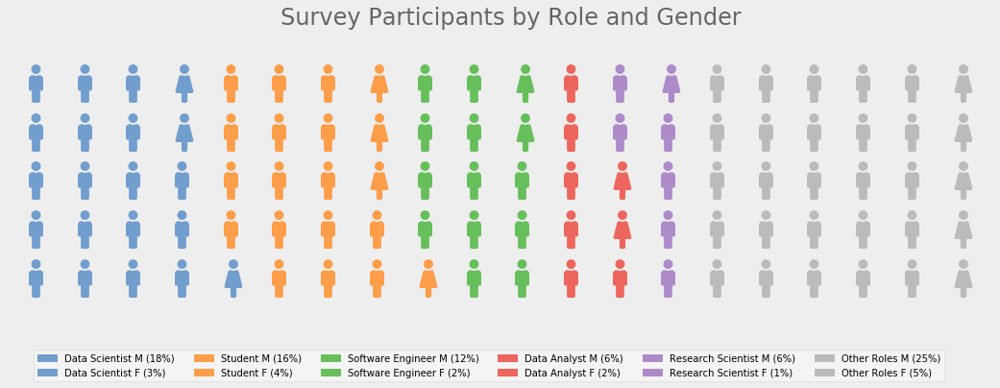

In [23]:
data = {'Data Scientist M': 18, 'Data Scientist F': 3,
        'Student M': 16, 'Student F': 4,
        'Software Engineer M': 12, 'Software Engineer F': 2,
        'Data Analyst M': 6, 'Data Analyst F': 2,
        'Research Scientist M': 6, 'Research Scientist F': 1,
        'Other Roles M': 25, 'Other Roles F':5}

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5, 
    values=data, 
    colors=('#729ECE','#729ECE','#FF9E4A','#FF9E4A','#67BF5C','#67BF5C','#ED665D','#ED665D','#AD8BC9','#AD8BC9','#BBBBBB','#BBBBBB'),
    icons=['male','female','male','female','male','female','male','female','male','female','male','female'],
    icon_size=40,
    #font_size=12,
    title={'label': 'Survey Participants by Role and Gender\n', 'loc': 'center','fontsize':24,'color':'#666666'},
    labels=["{0} ({1}%)".format(k, v) for k, v in data.items()],
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': 6, 'framealpha': 0.4},
    #plot_direction='NE',
    tight=False,
    figsize=(18, 12)
)
fig.set_facecolor('#EEEEEE')
plt.show()


In [24]:
df1 = df[(df['Gender']=='Male') | (df['Gender']=='Female')]

# <a>1.2 What are Favourite Data Science Media?</a>

So what are preferred Data Science and Machine Learning media. What youngstr's prefer. Is there any difference what Female Data Scientists prefer vs. Male Data Scientists.

In [25]:
pivot11 = df1.groupby(['Gender','Age'])['Count','Media_Twitter','Media_HackerNews','Media_Reddit','Media_Kaggle',
                                        'Media_CourseForums','Media_YouTube','Media_Podcasts','Media_Blogs','Media_Journal','Media_Slack'].agg(['sum'])
#pivot11.index

In [26]:
pivot12 = pivot11.values

In [27]:
#pivot12 = pivot11.values

# pass in array and columns
pivot13 = pd.DataFrame(pivot12,index=['Female \n18-21',
            'Female \n22-24',
            'Female \n25-29',
            'Female \n30-34',
            'Female \n35-39',
            'Female \n40-44',
            'Female \n45-49',
            'Female \n50-54',
            'Female \n55-59',
            'Female \n60-69',
            'Female \n70+',
            'Male \n18-21',
            'Male \n22-24',
            'Male \n25-29',
            'Male \n30-34',
            'Male \n35-39',
            'Male \n40-44',
            'Male \n45-49',
            'Male \n50-54',
            'Male \n55-59',
            'Male \n60-69',
            'Male \n70+'],
                       columns=['Survey_Participants','Twitter','HackerNews','Reddit','Kaggle','Course Forums',
                                'YouTube','Podcasts','Blogs','Journal','Slack'])

pivot14 = pivot13.copy()
pivot13 = pivot13.rename(columns={'Survey_Participants':'Survey Participants'})

pivot14 = pivot13[['Twitter','HackerNews','Reddit','Kaggle','Course Forums','YouTube','Podcasts','Blogs','Journal','Slack']].div(pivot14.Survey_Participants, axis=0) * 100

<Figure size 432x288 with 0 Axes>

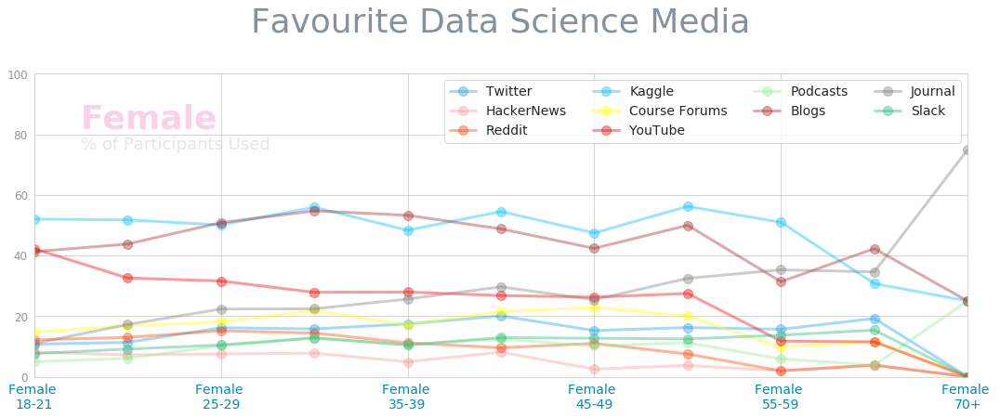

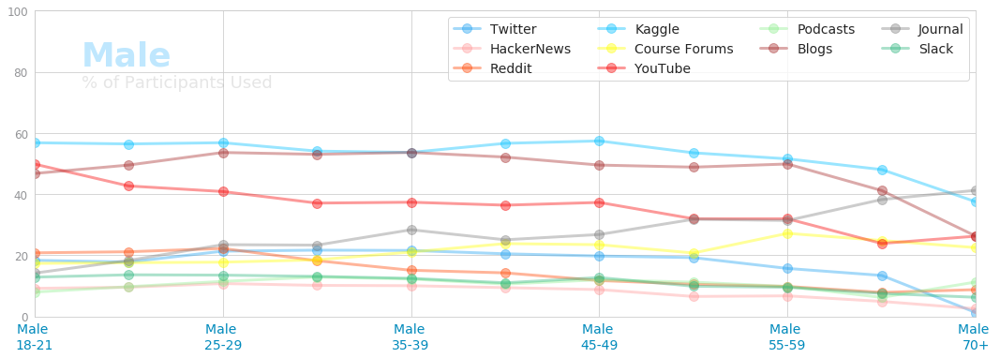

In [28]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot14[0:11].plot(figsize=(18, 6),kind='line',alpha=0.40,linewidth=3,marker='o',markersize=10,color=['#1da1f2','#ff9999','#ff4500','#00c0ff',
                                                                'yellow','#f80000','lightgreen','brown','grey','#2db67e'])
plt.title("Favourite Data Science Media\n", loc="center",size=36,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=2)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=14,color='#008abc')
plt.yticks(size=12,color='#939497')
plt.ylim(0,100)
plt.legend(fontsize=14,ncol=4,loc='topright')
plt.text(0.5,82, 'Female', fontsize=36,weight='bold',alpha=0.25,color='#eb49a6')
plt.text(0.5,75, '% of Participants Used', fontsize=18,alpha=0.25,color='#999999')
#plt.show()
ax = pivot14[11:22].plot(figsize=(18, 6),kind='line',alpha=0.40,linewidth=3,marker='o',markersize=10,color=['#1da1f2','#ff9999','#ff4500','#00c0ff',
                                                                'yellow','#f80000','lightgreen','brown','grey','#2db67e'])
plt.title("", loc="center",size=36,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=2)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=14,color='#008abc')
plt.yticks(size=12,color='#939497')
plt.ylim(0,100)
plt.legend(fontsize=14,ncol=4,loc='topright')
plt.text(0.5, 82, 'Male', fontsize=36,weight='bold',alpha=0.25,color='#02a3fe')
plt.text(0.5,75, '% of Participants Used', fontsize=18,alpha=0.25,color='#999999')
plt.show()

> 

# <a>1.3 Who performs what DS/ML activity?</a>
So what are preferred Data Science and Machine Learning media. What youngstr's prefer. Is there any difference what Female Data Scientists prefer vs. Male Data Scientists.

In [29]:
df2 = df[(df['Role']=='Software Engineer') | (df['Role']=='Data Scientist') | (df['Role']=='Statistician')
        | (df['Role']=='Product/Project Manager') | (df['Role']=='Data Analyst') | (df['Role']=='Research Scientist')
        | (df['Role']=='Business Analyst') | (df['Role']=='Data Engineer') | (df['Role']=='DBA/Database Engineer')].copy()

In [30]:
pivot21 = df2.groupby(['Role'])['Count','Role_Analyze_Data','Role_Build_Data_Infra','Role_Build_Prototype','Role_ML_Service',
                              'Role_ML_Experimentation','Role_ML_Research'].agg(['sum'])
#pivot21.index

In [31]:
pivot21 = df2.groupby(['Role'])['Count','Role_Analyze_Data','Role_Build_Data_Infra','Role_Build_Prototype','Role_ML_Service',
                              'Role_ML_Experimentation','Role_ML_Research'].agg(['sum'])


pivot22 = pivot21.values

# pass in array and columns
pivot23 = pd.DataFrame(pivot22,index=['Business\nAnalyst', 'DBA/\nDatabase \nEngineer', 'Data\nAnalyst',
                                    'Data\nEngineer', 'Data\nScientist', 'Product/Project\nManager',
                                    'Research\nScientist','Software\nEngineer', 'Statistician'],
                       columns=['Survey_Participants','Analyze Data','Build Data Infrastructure',
                      'Build Prototype','ML Service','ML Experimentation','ML Research'])

pivot24 = pivot23.copy()
pivot23 = pivot23.rename(columns={'Survey_Participants':'Survey Participants'})
pivot24 = pivot24[['Analyze Data','Build Data Infrastructure',
                      'Build Prototype','ML Service','ML Experimentation',
        'ML Research']].div(pivot24.Survey_Participants, axis=0) * 100

pivot23['order'] = [4,8,2,6,0,5,3,1,7]
pivot24['order'] =  [4,8,2,6,0,5,3,1,7]
pivot23 = pivot23.sort_values(by=['order'])
pivot24 = pivot24.sort_values(by=['order'])
del pivot23['order']
del pivot24['order']

<Figure size 432x288 with 0 Axes>

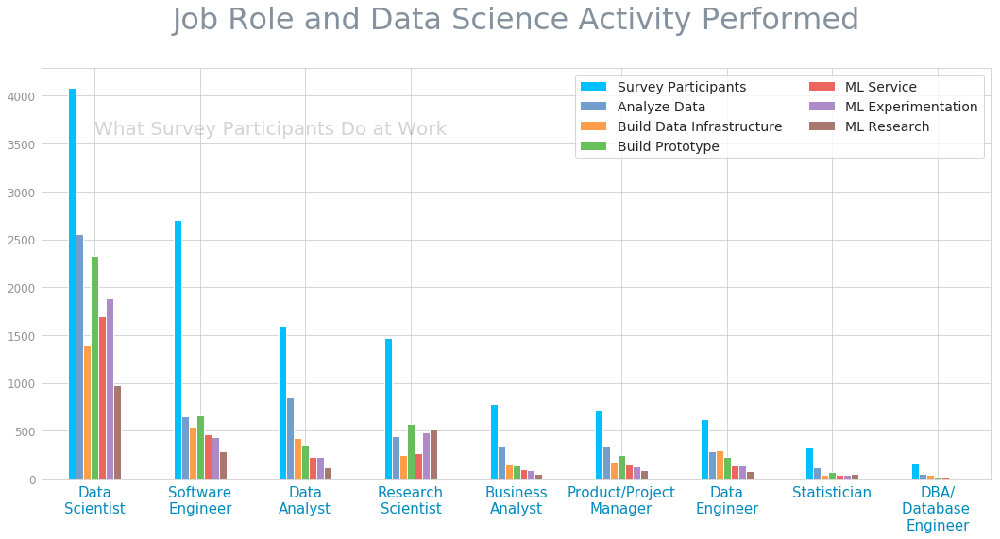

In [32]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot23.plot(figsize=(18, 8),title='Role',kind='bar',color=['#00c0ff','#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E'])
plt.title("Job Role and Data Science Activity Performed\n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 3600, 'What Survey Participants Do at Work', fontsize=20,alpha=0.2)
plt.legend(fontsize=14,loc='topleft',ncol=2)
plt.show()

<Figure size 432x288 with 0 Axes>

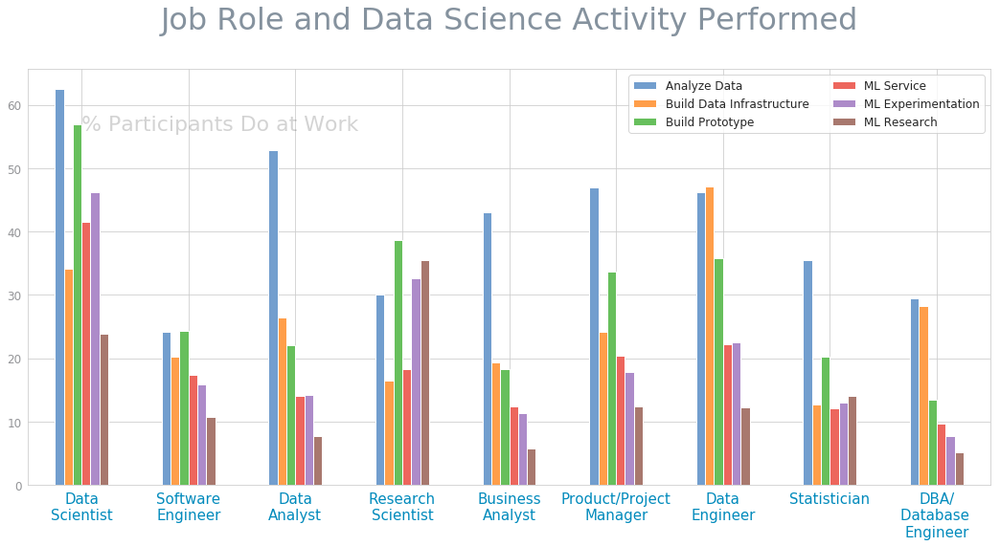

In [33]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot24.plot(figsize=(18, 8),title='Role',kind='bar',color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E'])
plt.title("Job Role and Data Science Activity Performed\n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
# #729ECE #FF9E4A #67BF5C #ED665D #AD8BC9 #A8786E #ED97CA #A2A2A2 #CDCC5D #6DCCDA

plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 56, '% Participants Do at Work', fontsize=22,alpha=0.2)
plt.legend(fontsize=12,ncol=2)
plt.show()

In [34]:
df3 = df.copy()

In [35]:
pivot31 = df3.groupby(['Role'])['Count','Course_Udacity','Course_Coursera','Course_edX','Course_DataCamp','Course_DataQuest','Course_Kaggle',
                  'Course_Fastai','Course_Udemy','Course_Linkedin','Course_University'].agg(['sum'])
#pivot31.index

In [36]:
pivot32 = pivot31.values

# pass in array and columns
pivot33 = pd.DataFrame(pivot32,index=['Business\nAnalyst', 'DBA/\nDatabase \nEngineer', 'Data\nAnalyst',
                                    'Data\nEngineer', 'Data\nScientist', 'Not\nEmployed','Other','Product/Project\nManager',
                                    'Research\nScientist','Software\nEngineer', 'Statistician','Student'],
                       columns=['Survey_Participants','Udacity','Coursera','edX','DataCamp','DataQuest','Kaggle',
                                'Fastai','Udemy','Linkedin','University'])

pivot34 = pivot33.copy()
pivot33 = pivot33.rename(columns={'Survey_Participants':'Survey Participants'})
pivot34 = pivot34[['Udacity','Coursera','edX','DataCamp','DataQuest','Kaggle',
                                'Fastai','Udemy','Linkedin','University']].div(pivot34.Survey_Participants, axis=0) * 100



pivot33['order'] = [7,11,4,9,0,6,3,8,5,2,10,1]
pivot34['order'] =  [7,11,4,9,0,6,3,8,5,2,10,1]
pivot33 = pivot33.sort_values(by=['order'])
pivot34 = pivot34.sort_values(by=['order'])
del pivot33['order']
del pivot34['order']

# <a>1.4 Where are preferred DS Courses?</a>

<Figure size 432x288 with 0 Axes>

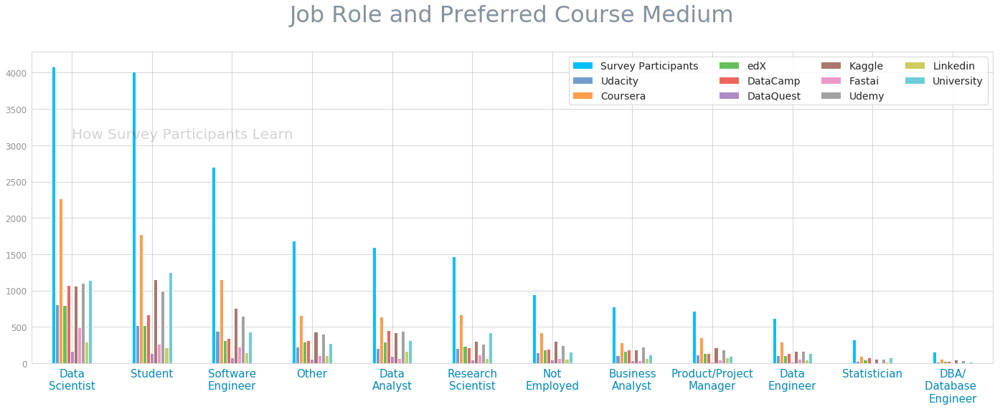

In [37]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot33.plot(figsize=(24, 8),title='Role',kind='bar',color=['#00c0ff','#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Job Role and Preferred Course Medium\n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 3100, 'How Survey Participants Learn', fontsize=20,alpha=0.2)
plt.legend(fontsize=14,ncol=4,loc='topright')
plt.show()

<Figure size 432x288 with 0 Axes>

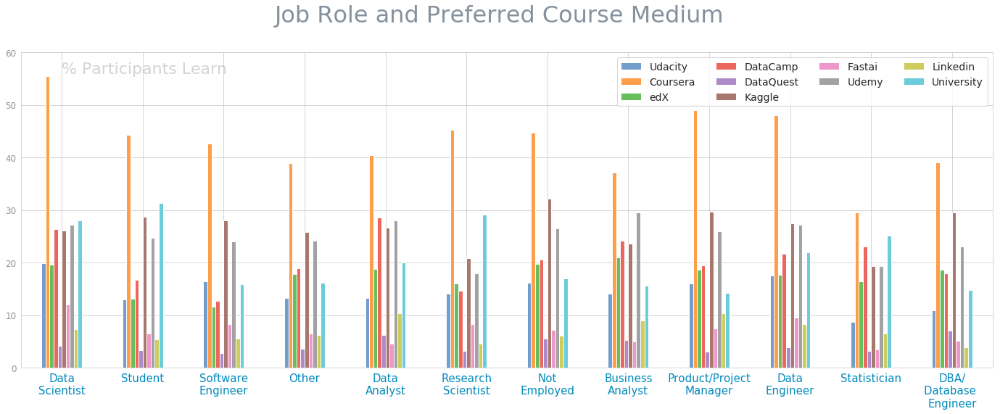

In [38]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot34.plot(figsize=(24, 8),title='Role',kind='bar',color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Job Role and Preferred Course Medium  \n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
# #729ECE #FF9E4A #67BF5C #ED665D #AD8BC9 #A8786E #ED97CA #A2A2A2 #CDCC5D #6DCCDA

plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 56, '% Participants Learn', fontsize=22,alpha=0.2)
plt.ylim(0,60)
plt.legend(fontsize=14,ncol=4,loc='topright')
plt.show()

In [39]:
df4 = df.copy()

In [40]:
pivot41 = df4.groupby(['Education'])['Count','Course_Udacity','Course_Coursera','Course_edX','Course_DataCamp','Course_DataQuest','Course_Kaggle',
                  'Course_Fastai','Course_Udemy','Course_Linkedin','Course_University'].agg(['sum'])
#pivot41.index

In [41]:
pivot42 = pivot41.values

# pass in array and columns
pivot43 = pd.DataFrame(pivot42,index=['Bachelor''s degree','Doctoral degree','I prefer not to answer','Master''s degree',
                                      'High School','Professional degree','Some college/university'],
                       columns=['Survey_Participants','Udacity','Coursera','edX','DataCamp','DataQuest','Kaggle',
                                'Fastai','Udemy','Linkedin','University'])

pivot44 = pivot43.copy()
pivot43 = pivot43.rename(columns={'Survey_Participants':'Survey Participants'})
pivot44 = pivot44[['Udacity','Coursera','edX','DataCamp','DataQuest','Kaggle',
                                'Fastai','Udemy','Linkedin','University']].div(pivot44.Survey_Participants, axis=0) * 100

pivot43['order'] = [2,0,6,1,5,3,4]
pivot44['order'] = [2,0,6,1,5,3,4]
pivot43 = pivot43.sort_values(by=['order'])
pivot44 = pivot44.sort_values(by=['order'])
del pivot43['order']
del pivot44['order']

# <a>1.5 What is the Relationship with Choice of Course and Education Level?</a>

<Figure size 432x288 with 0 Axes>

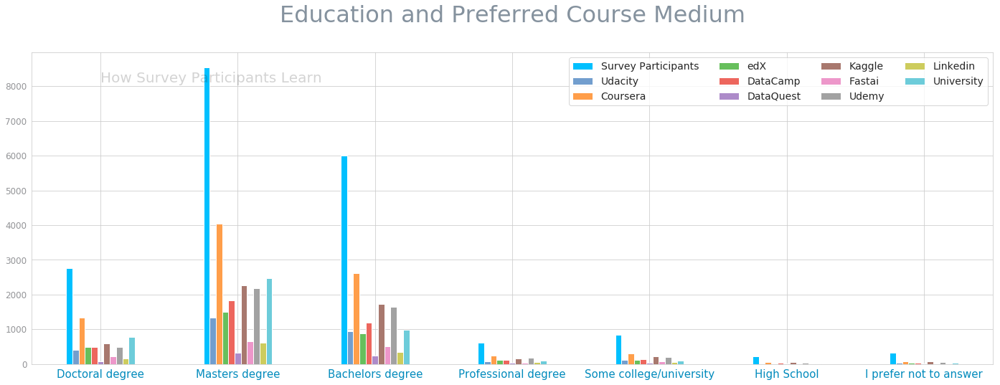

In [42]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot43.plot(figsize=(24, 8),title='Role',kind='bar',color=['#00c0ff','#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Education and Preferred Course Medium\n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 8100, 'How Survey Participants Learn', fontsize=20,alpha=0.2)
plt.legend(fontsize=14,ncol=4,loc='topright')
plt.show()

<Figure size 432x288 with 0 Axes>

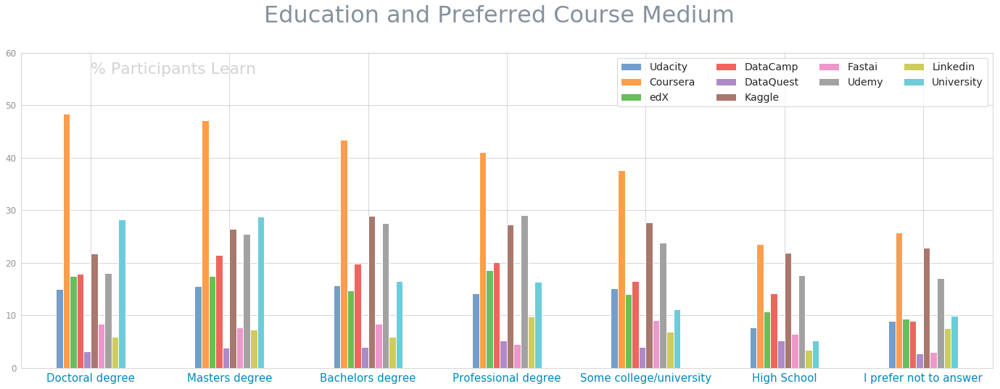

In [43]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot44.plot(figsize=(24, 8),title='Role',kind='bar',color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Education and Preferred Course Medium  \n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
# #729ECE #FF9E4A #67BF5C #ED665D #AD8BC9 #A8786E #ED97CA #A2A2A2 #CDCC5D #6DCCDA

plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 56, '% Participants Learn', fontsize=22,alpha=0.2)
plt.ylim(0,60)
plt.legend(fontsize=14,ncol=4,loc='topright')
plt.show()

In [44]:
df5 = df.copy()

In [45]:
pivot51 = df5.groupby(['ML_Since'])['Count','Algorithm_Regression','Algorithm_Tree','Algorithm_GBM',
                       'Algorithm_Bayesian','Algorithm_Evolutionary','Algorithm_DNN','Algorithm_CNN',
                       'Algorithm_GAN','Algorithm_RNN','Algorithm_Transformer'].agg(['sum'])
#pivot51.index

In [46]:
pivot52 = pivot51.values

# pass in array and columns
pivot53 = pd.DataFrame(pivot52,index=['1-2 years', '10-15 years', '2-3 years', '20+ years', '3-4 years',
       '4-5 years', '5-10 years', '< 1 years'],
                       columns=['Survey_Participants','Regression','Tree Based','GBM','Bayesian','Evolutionary',
                                'DNN','CNN','GAN','RNN','Transformer'])

pivot54 = pivot53.copy()
pivot53 = pivot53.rename(columns={'Survey_Participants':'Survey Participants'})
pivot54 = pivot54[['Regression','Tree Based','GBM','Bayesian','Evolutionary',
                                'DNN','CNN','GAN','RNN','Transformer']].div(pivot54.Survey_Participants, axis=0) * 100

pivot53['order'] = [6,1,5,0,4,3,2,7]
pivot54['order'] = [6,1,5,0,4,3,2,7]
pivot53 = pivot53.sort_values(by=['order'])
pivot54 = pivot54.sort_values(by=['order'])
del pivot53['order']
del pivot54['order']

# <a>1.6 What are preffered ML Algorithms for participants at various experience level?</a>

<Figure size 432x288 with 0 Axes>

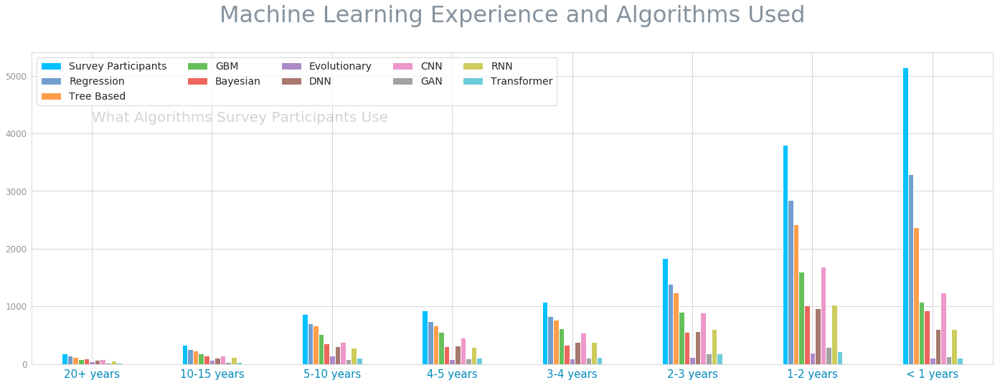

In [47]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot53.plot(figsize=(24, 8),title='Role',kind='bar',color=['#00c0ff','#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Machine Learning Experience and Algorithms Used\n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 4200, 'What Algorithms Survey Participants Use', fontsize=20,alpha=0.2)
plt.legend(fontsize=14,ncol=5,loc='topright')
plt.show()

<Figure size 432x288 with 0 Axes>

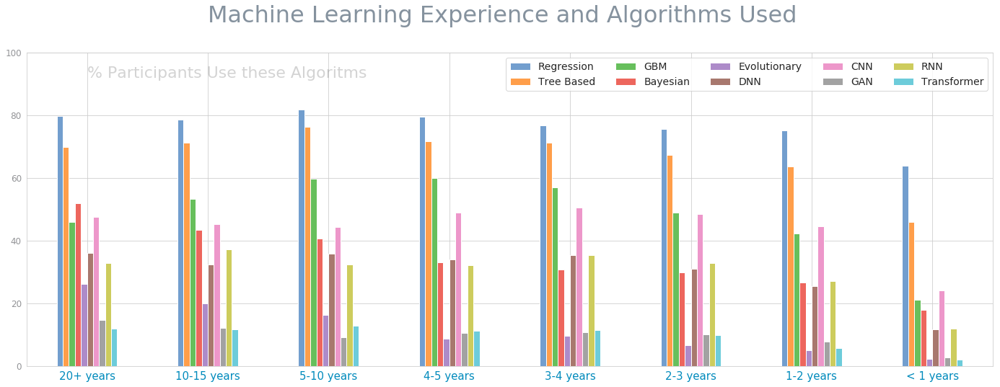

In [48]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot54.plot(figsize=(24, 8),title='Role',kind='bar',color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Machine Learning Experience and Algorithms Used  \n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
# #729ECE #FF9E4A #67BF5C #ED665D #AD8BC9 #A8786E #ED97CA #A2A2A2 #CDCC5D #6DCCDA

plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 92, '% Participants Use these Algoritms', fontsize=22,alpha=0.2)
plt.ylim(0,100)
plt.legend(fontsize=14,ncol=5,loc='topright')
plt.show()

In [49]:
df6 = df.copy()

In [50]:
pivot61 = df6.groupby(['Hardware'])['Count','Algorithm_Regression','Algorithm_Tree','Algorithm_GBM',
                       'Algorithm_Bayesian','Algorithm_Evolutionary','Algorithm_DNN','Algorithm_CNN',
                       'Algorithm_GAN','Algorithm_RNN','Algorithm_Transformer'].agg(['sum'])
#pivot61.index

In [51]:
pivot62 = pivot61.values

# pass in array and columns
pivot63 = pd.DataFrame(pivot62,index=['GPU', 'GPU, TPU Few Times', 'GPU, TPU Multiple Times', 'No GPU/TPU',
       'TPU Few Times', 'TPU Multiple Times'],
                       columns=['Survey_Participants','Regression','Tree Based','GBM','Bayesian','Evolutionary',
                                'DNN','CNN','GAN','RNN','Transformer'])

pivot64 = pivot63.copy()
pivot63 = pivot63.rename(columns={'Survey_Participants':'Survey Participants'})
pivot64 = pivot64[['Regression','Tree Based','GBM','Bayesian','Evolutionary',
                                'DNN','CNN','GAN','RNN','Transformer']].div(pivot64.Survey_Participants, axis=0) * 100
    
    
pivot63['order'] = [4,1,0,5,3,2]
pivot64['order'] = [4,1,0,5,3,2]
pivot63 = pivot63.sort_values(by=['order'])
pivot64 = pivot64.sort_values(by=['order'])
del pivot63['order']
del pivot64['order']

# <a>1.7 What is the relationship with Hardware used and preffered ML Algorithms?</a>

<Figure size 432x288 with 0 Axes>

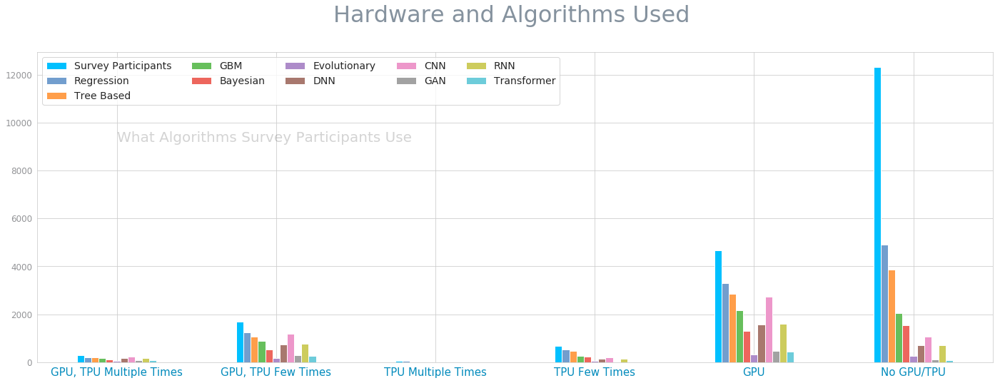

In [52]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot63.plot(figsize=(24, 8),title='Role',kind='bar',color=['#00c0ff','#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Hardware and Algorithms Used \n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 9200, 'What Algorithms Survey Participants Use', fontsize=20,alpha=0.2)
plt.legend(fontsize=14,ncol=5,loc='topright')
plt.show()

<Figure size 432x288 with 0 Axes>

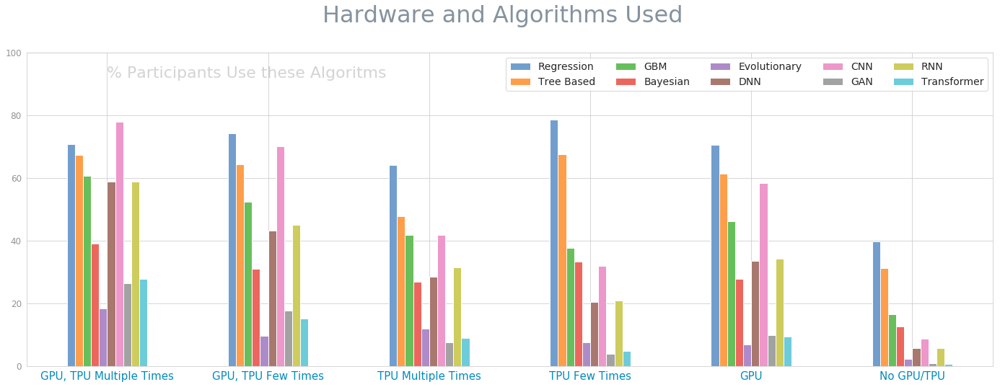

In [53]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot64.plot(figsize=(24, 8),title='Role',kind='bar',color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Hardware and Algorithms Used  \n", loc="center",size=32,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
# #729ECE #FF9E4A #67BF5C #ED665D #AD8BC9 #A8786E #ED97CA #A2A2A2 #CDCC5D #6DCCDA

plt.xlabel('',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=12,color='#939497')
plt.text(0, 92, '% Participants Use these Algoritms', fontsize=22,alpha=0.2)
plt.ylim(0,100)
plt.legend(fontsize=14,ncol=5,loc='topright')
plt.show()

# <a>1.8 What is the relationship of Recommended Language and Language Used?</a>

In [54]:
df7 = df.copy()

In [55]:
pivot71 = df7.groupby(['Recommended_Language'])['Count','Language_Python','Language_R','Language_SQL','Language_C','Language_C++',
             'Language_Java','Language_Javascript','Language_TypeScript','Language_Bash','Language_MATLAB'].agg(['sum'])
#pivot71.index

In [56]:
pivot72 = pivot71.values

pivot73 = pd.DataFrame(pivot72,index=['Bash', 'C', 'C++', 'Java', 'Javascript', 'MATLAB', 'None', 'Other',
       'Python', 'R', 'SQL', 'TypeScript'],
                       columns=['Survey_Participants','Language_Python','Language_R','Language_SQL',
                                        'Language_C','Language_C++',
             'Language_Java','Language_Javascript','Language_TypeScript','Language_Bash','Language_MATLAB'])
pivot74 = pivot73.copy()
pivot73 = pivot73.rename(columns={'Survey_Participants':'Survey Participants'})

pivot74 = pivot73[['Language_Python','Language_R','Language_SQL','Language_C','Language_C++',
             'Language_Java','Language_Javascript','Language_TypeScript','Language_Bash','Language_MATLAB']].div(pivot74.Survey_Participants, axis=0) * 100

In [57]:
pivot74=pivot74.rename(columns={'Language_Python':'Python User','Language_R':'R User','Language_SQL':'SQL User',
                                'Language_C':'C User','Language_C++':'C++ User',
             'Language_Java':'Java User','Language_Javascript':'Javascript User',
                                'Language_TypeScript':'Typescript User',
                                'Language_Bash':'Bash User',
                                'Language_MATLAB':'MATLAB User'})

<Figure size 432x288 with 0 Axes>

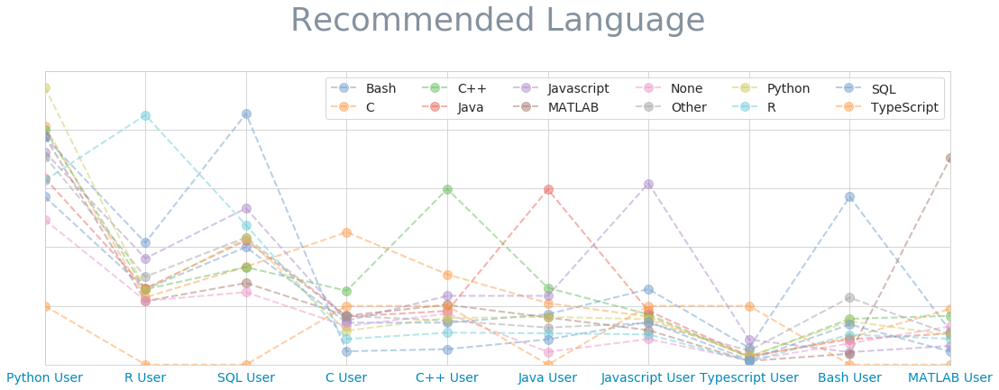

In [58]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot74.transpose().plot(figsize=(18, 6),kind='line',alpha=0.50,linewidth=2,marker='o',
                              markersize=10,linestyle='dashed',
                 color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Recommended Language\n", loc="center",size=36,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('',color='#34495E',fontsize=2)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=14,color='#008abc')
plt.yticks(size=12,color='#ffffff')
plt.ylim(0,100)
plt.legend(fontsize=14,ncol=6,loc='topright')

In [59]:
pivot81 = df7.groupby(['Age'])['Count','Language_Python','Language_R','Language_SQL','Language_C','Language_C++',
             'Language_Java','Language_Javascript','Language_TypeScript','Language_Bash','Language_MATLAB'].agg(['sum'])
#pivot81.index

In [60]:
pivot82 = pivot81.values

pivot83 = pd.DataFrame(pivot82,index=['18-21', '22-24', '25-29', '30-34', '35-39', '40-44', '45-49', '50-54',
       '55-59', '60-69', '70+'],
                       columns=['Survey_Participants','Language_Python','Language_R','Language_SQL',
                                        'Language_C','Language_C++',
             'Language_Java','Language_Javascript','Language_TypeScript','Language_Bash','Language_MATLAB'])
pivot84 = pivot83.copy()
pivot83 = pivot83.rename(columns={'Survey_Participants':'Survey Participants'})

pivot84 = pivot83[['Language_Python','Language_R','Language_SQL','Language_C','Language_C++',
             'Language_Java','Language_Javascript','Language_TypeScript','Language_Bash','Language_MATLAB']].div(pivot84.Survey_Participants, axis=0) * 100

In [61]:
pivot84=pivot84.rename(columns={'Language_Python':'Python User','Language_R':'R User','Language_SQL':'SQL User',
                                'Language_C':'C User','Language_C++':'C++ User',
             'Language_Java':'Java User','Language_Javascript':'Javascript User',
                                'Language_TypeScript':'Typescript User',
                                'Language_Bash':'Bash User',
                                'Language_MATLAB':'MATLAB User'})

# <a>1.9 What is the relationship of Age and Programming Language Used?</a>

<Figure size 432x288 with 0 Axes>

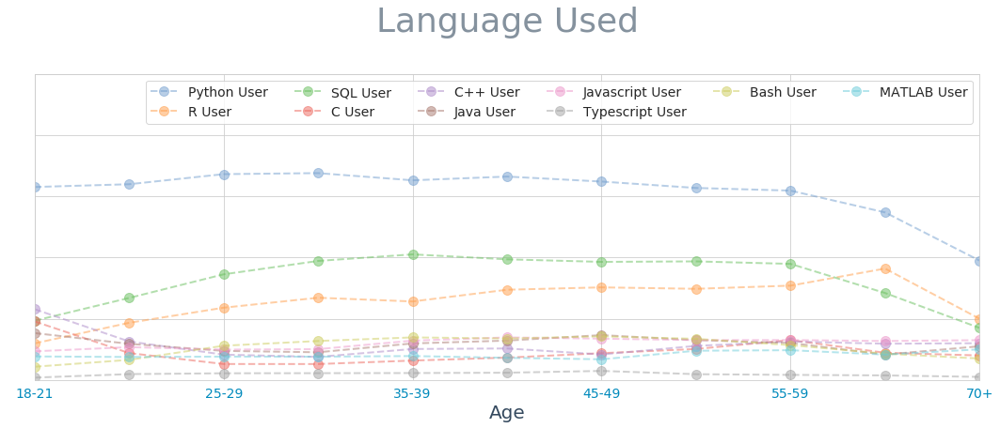

In [62]:
plt.clf()
sns.set_style("whitegrid")
ax = pivot84.plot(figsize=(18, 6),kind='line',alpha=0.50,linewidth=2,marker='o',
                              markersize=10,linestyle='dashed',
                 color=['#729ECE','#FF9E4A','#67BF5C','#ED665D','#AD8BC9','#A8786E',
                                                                '#ED97CA', '#A2A2A2', '#CDCC5D', '#6DCCDA'])
plt.title("Language Used\n", loc="center",size=36,color='#34495E',alpha=0.6)
# #535979, #5175a8, #59a9ae, #9aa16f, #f88b7e, #e1adbc, #fce133, #b3e4e5
plt.xlabel('Age',color='#34495E',fontsize=20)
plt.ylabel('',color='#34499E',fontsize=2)
plt.xticks(size=14,color='#008abc')
plt.yticks(size=12,color='#ffffff')
plt.ylim(0,100)
plt.legend(fontsize=14,ncol=6,loc='topright')

In [63]:
df = multi_encoding(df,'Data_Analysis_Response')
df = multi_encoding(df,'Age')
df = multi_encoding(df,'Country')
df = multi_encoding(df,'Education')
df = multi_encoding(df,'Role')
df = multi_encoding(df,'Company_Size')
df = multi_encoding(df,'DS_Team_Size')
df = multi_encoding(df,'ML_in_Business')
df = multi_encoding(df,'Salary')
df = multi_encoding(df,'ML_Spend')
df = multi_encoding(df,'Writing_Code')
df = multi_encoding(df,'Recommended_Language')
df = multi_encoding(df,'ML_Since')

In [64]:
dfcorr = df[['Role:Data Scientist','Role:Student','Role:Software Engineer','Role:Data Analyst','Role:Research Scientist',
              'Education:Doctoral degree','Education:Master’s degree','Education:Bachelor’s degree',
              'ML_Since:20+ years','ML_Since:10-15 years','ML_Since:5-10 years','ML_Since:4-5 years','ML_Since:3-4 years',
              'ML_Since:2-3 years','ML_Since:1-2 years','ML_Since:< 1 years', 
              'Language_Python','Language_R','Language_SQL','Language_C','Language_C++',
             'Language_Java','Language_MATLAB']].copy()
             

dfcorr = dfcorr.rename(columns={'Role:Data Scientist':'Data Scientist','Role:Student':'Student',
                                'Role:Software Engineer':'Software Engineer','Role:Data Analyst':'Data Analyst',
                                'Role:Research Scientist':'Research Scientist','Education:Doctoral degree':'Doctoral Degree',
                                'Education:Master’s degree':'Master’s degree','Education:Bachelor’s degree':'Bachelor’s degree',
                                'ML_Since:20+ years':'20+ Years in ML','ML_Since:10-15 years':'10-15 Years in ML',
                                'ML_Since:5-10 years':'5-10 Years in ML','ML_Since:4-5 years':'4-5 Years in ML',
                                'ML_Since:3-4 years':'3-4 Years in ML','ML_Since:2-3 years':'2-3 Years in ML',
                                'ML_Since:1-2 years':'1-2 Years in ML','ML_Since:< 1 years':'< 1 Year in ML', 
                                'Language_Python':'Language: Python','Language_R':'Language: R',
                                'Language_SQL':'Language: SQL','Language_C':'Language C','Language_C++':'Language: C++',
                                'Language_Java':'Language: Java','Language_MATLAB':'Language: MATLAB'})

dfcorr1 = dfcorr.corr()

# <a>1.10 What are the relationships of preferred Languages with Role and Education?</a>

Text(0.5, 1.0, 'Role, Education, Experience & Language Used')

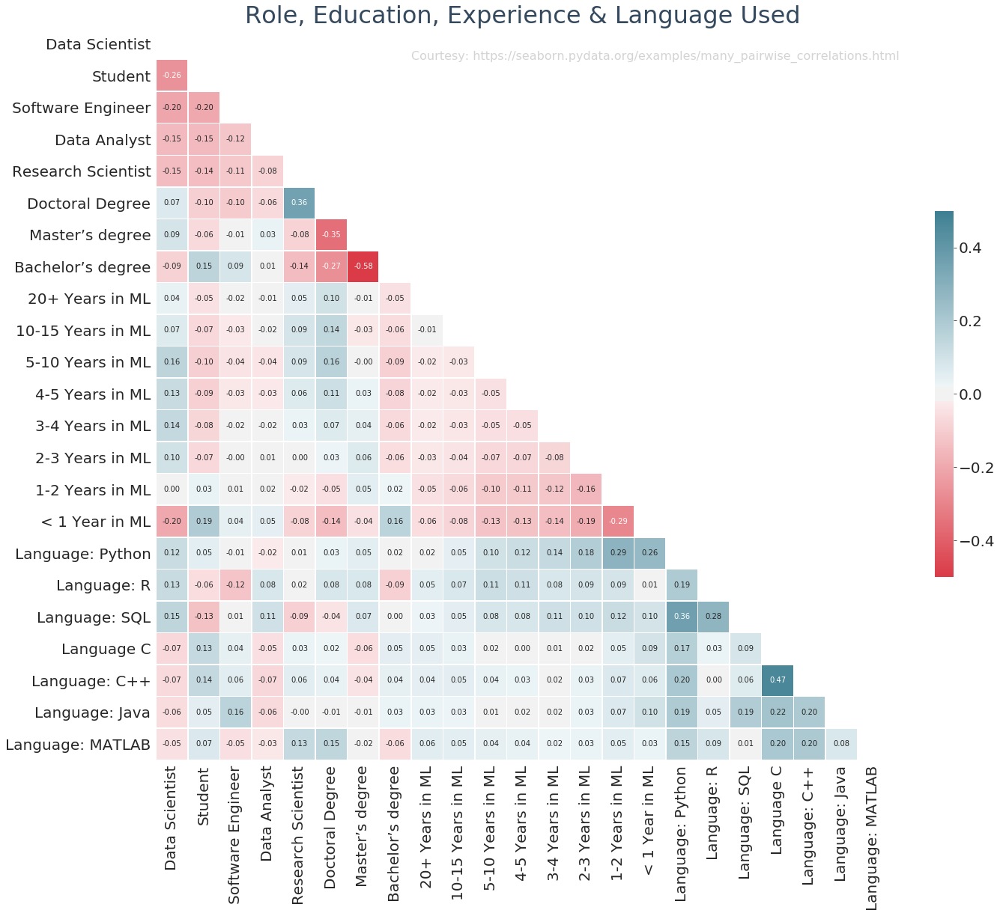

In [65]:
# Correlation Plot 1

import matplotlib as mpl
from matplotlib import cm as cm

label_size = 20
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(dfcorr1, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (22,18))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(dfcorr1, mask = mask, vmax = .5, vmin = -.5, center = 0,cmap=cmap,
           annot = True, square = True,linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("Role, Education, Experience & Language Used", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 1'+'.png', bbox_inches = 'tight')

# <a>1.11 What are the relationships of Launguage Used vs Recommended Language?</a>

In [66]:
dfcorr = df[['Language_Python','Language_R','Language_SQL','Language_C','Language_C++','Language_Java',
             'Language_MATLAB','Recommended_Language:Python','Recommended_Language:R',
             'Recommended_Language:SQL','Recommended_Language:C',
             'Recommended_Language:C++','Recommended_Language:Java',
             'Recommended_Language:MATLAB']].copy()
             

dfcorr = dfcorr.rename(columns={'Language_Python': 'Used:Python','Language_R':'Used:R',
             'Language_SQL': 'Used:SQL','Language_C':'Used:C',
             'Language_C++':'Used:C++','Language_Java':'Used:Java',
             'Language_MATLAB':'Used:MATLAB','Recommended_Language:Python': 'Recommended:Python',
             'Recommended_Language:R':'Recommended:R',
             'Recommended_Language:SQL':'Recommended:SQL','Recommended_Language:C':'Recommended:C',
             'Recommended_Language:C++':'Recommended:C++','Recommended_Language:Java':'Recommended:Java',
             'Recommended_Language:MATLAB':'Recommended:MATLAB'})

dfcorr5 = dfcorr.corr()

Text(0.5, 1.0, 'Language Used vs Recommended Language')

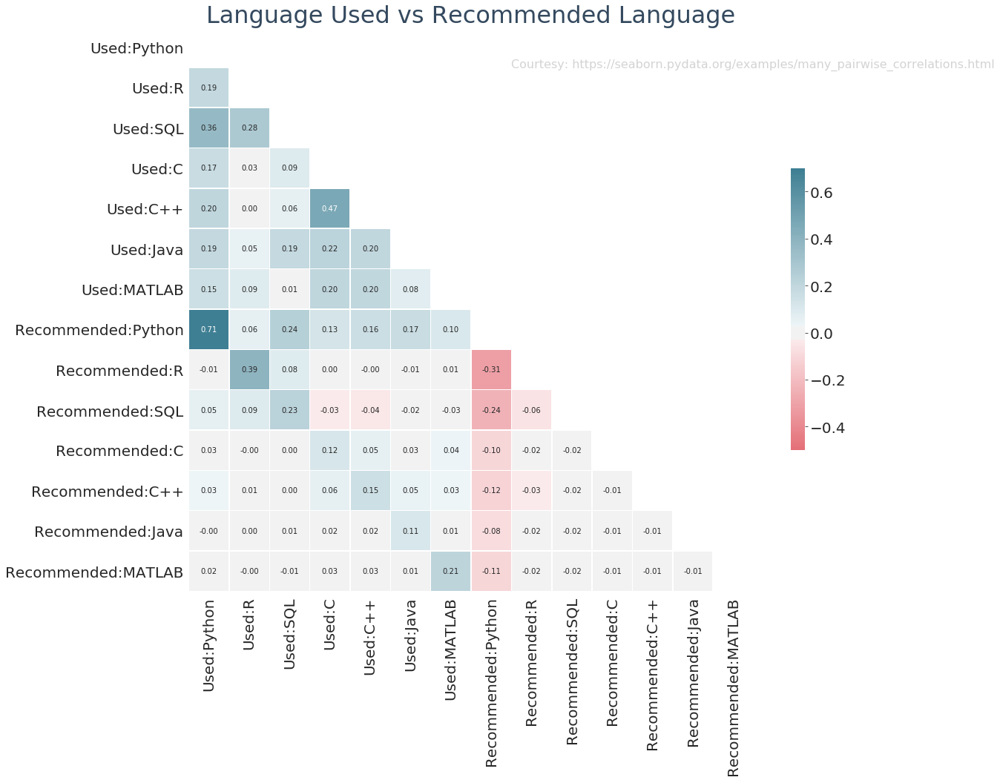

In [67]:
label_size = 20
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(dfcorr5, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (18,14))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(dfcorr5, mask = mask, vmax = .7, vmin = -.5, center = 0,cmap=cmap,
           annot = True, square = True,linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("Language Used vs Recommended Language", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 1'+'.png', bbox_inches = 'tight')

In [68]:
dfcorr = df[['ML_Spend:> $100,000 ($USD)','ML_Spend:$10,000-$99,999','ML_Spend:$1000-$9,999',
              'ML_Spend:$100-$999','ML_Spend:$1-$99',
              'Cloud_Platform_GCP','Cloud_Platform_AWS','Cloud_Platform_Azure','Cloud_Platform_IBM',
              'Cloud_Platform_Alibaba','Cloud_Platform_Salesforce','Cloud_Platform_Oracle','Cloud_Platform_SAP',
              'Cloud_Platform_VMware','Cloud_Platform_RedHat',
              'Cloud_Product_AWS_EC2','Cloud_Product_Google_ComputeEngine','Cloud_Product_AWS_Lambda',
              'Cloud_Product_Azure_VM','Cloud_Product_Google_AppEngine','Cloud_Product_Google_CloudFunctions',
              'Cloud_Product_AWS_EBS','Cloud_Product_Google_Kubernetes','Cloud_Product_AWS_Batch','Cloud_Product_Azure_Container']].copy()
            
             
dfcorr = dfcorr.rename(columns={'ML_Spend:> $100,000 ($USD)':'Money:> 100,000 USD',
                                'ML_Spend:$10,000-$99,999': 'Money: 10,000-99,999 USD',
                                'ML_Spend:$1000-$9,999':'Money: 1000-9,999 USD',
                                'ML_Spend:$100-$999':'Money: 100-999 USD',
                                'ML_Spend:$1-$99':'Money: 1-99 USD',
                                'Cloud_Platform_GCP':'Cloud Platform: GCP','Cloud_Platform_AWS':'Cloud Platform: AWS',
                                'Cloud_Platform_Azure':'Cloud Platform: Azure','Cloud_Platform_IBM':'Cloud Platform: IBM',
                                'Cloud_Platform_Alibaba':'Cloud Platform: Alibaba',
                                'Cloud_Platform_Salesforce':'Cloud Platform: Salesforce',
                                'Cloud_Platform_Oracle':'Cloud Platform: Oracle','Cloud_Platform_SAP':'Cloud Platform: SAP',
                                'Cloud_Platform_VMware':'Cloud Platform: VMware','Cloud_Platform_RedHat':'Cloud Platform: RedHat',
                                'Cloud_Product_AWS_EC2':'AWS EC2',
                                'Cloud_Product_Google_ComputeEngine':'Google ComputeEngine',
                                'Cloud_Product_AWS_Lambda':'AWS Lambda','Cloud_Product_Azure_VM':'Azure VM',
                                'Cloud_Product_Google_AppEngine':'Google AppEngine',
                                'Cloud_Product_Google_CloudFunctions':'Google CloudFunctions',
                                'Cloud_Product_AWS_EBS':'AWS EBS',
                                'Cloud_Product_Google_Kubernetes':'Google Kubernetes',
                                'Cloud_Product_AWS_Batch':'AWS Batch',
                                'Cloud_Product_Azure_Container':'Azure Container'})

dfcorr2 = dfcorr.corr()

# <a>1.12 What are the relationships of Money Spent on ML vs Choice of Cloud Platform and Product?</a>

Text(0.5, 1.0, 'ML Spend vs Cloud Platform, Product')

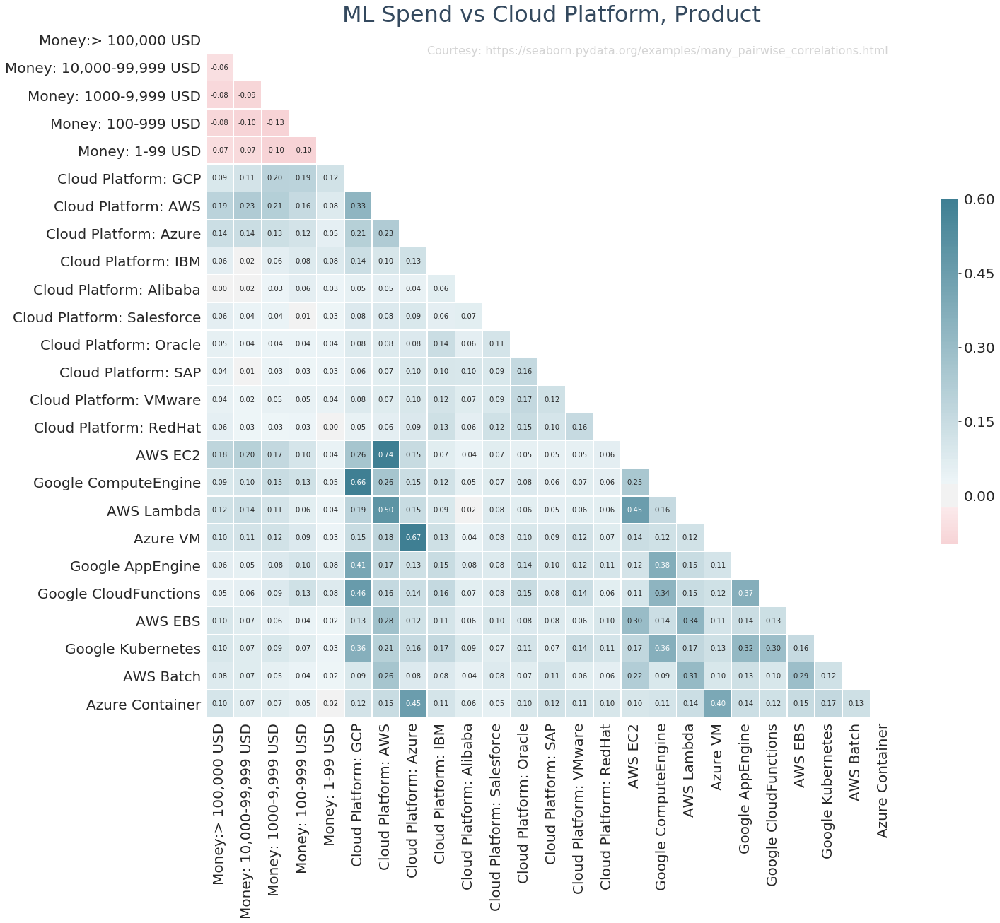

In [69]:
# Correlation Plot 2

label_size = 20
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(dfcorr2, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (22,18))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(dfcorr2, mask = mask, vmax = .6, vmin = -.1, center = 0,cmap=cmap,
           annot = True, square = True, linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("ML Spend vs Cloud Platform, Product", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 2'+'.png', bbox_inches = 'tight')


In [70]:
dfcorr = df[[ 'Cloud_Platform_GCP','Cloud_Platform_AWS','Cloud_Platform_Azure','Cloud_Platform_IBM',
              'Cloud_Platform_Alibaba','Cloud_Platform_Salesforce','Cloud_Platform_Oracle','Cloud_Platform_SAP',
              'Cloud_Platform_VMware','Cloud_Platform_RedHat',
              'BigData_Google_BigQuery','BigData_AWS_Redshift','BigData_Google_Databricks','BigData_AWS_EMR',
              'BigData_Teradata','BigData_MSAS','BigData_Google_CloudDataflow','BigData_AWS_Athena',
              'BigData_AWS_Kinesis','BigData_Google_CloudPub',
              'RDB_MySQL','RDB_PostgresSQL','RDB_SQLite','RDB_MS_SQLServer','RDB_Oracle','RDB_MS_Access','RDB_AWS_RDS',
              'RDB_AWS_DynamoDB','RDB_Azure_SQL','RDB_Google_CloudSQL']].copy()
             
dfcorr = dfcorr.rename(columns={'Cloud_Platform_GCP':'Cloud Platform: GCP','Cloud_Platform_AWS':'Cloud Platform: AWS',
                                'Cloud_Platform_Azure':'Cloud Platform: Azure','Cloud_Platform_IBM':'Cloud Platform: IBM',
                                'Cloud_Platform_Alibaba':'Cloud Platform: Alibaba',
                                'Cloud_Platform_Salesforce':'Cloud Platform: Salesforce',
                                'Cloud_Platform_Oracle':'Cloud Platform: Oracle','Cloud_Platform_SAP':'Cloud Platform: SAP',
                                'Cloud_Platform_VMware':'Cloud Platform: VMware','Cloud_Platform_RedHat':'Cloud Platform: RedHat',
                                'BigData_Google_BigQuery':'BigData: Google BigQuery',
                                'BigData_AWS_Redshift': 'BigData: AWS Redshift',
                                'BigData_Google_Databricks':'BigData: G Databricks',
                                'BigData_AWS_EMR':'BigData: AWS EMR',
                                'BigData_Teradata':'BigData: Teradata','BigData_MSAS':'BigData: MSAS',
                                'BigData_Google_CloudDataflow':'BigData: G CloudDataflow',
                                'BigData_AWS_Athena':'BigData: AWS Athena',
                                'BigData_AWS_Kinesis':'BigData: AWS Kinesis',
                                'BigData_Google_CloudPub':'BigData: G CloudPub',
                                'RDB_MySQL':'RDB MySQL','RDB_PostgresSQL':'RDB PostgresSQL','RDB_SQLite':'RDB SQLite',
                                'RDB_MS_SQLServer':'RDB MS SQLServer','RDB_Oracle':'RDB Oracle',
                                'RDB_MS_Access':'RDB MS Access','RDB_AWS_RDS':'RDB AWS RDS',
                                'RDB_AWS_DynamoDB':'RDB AWS DynamoDB','RDB_Azure_SQL':'RDB Azure SQL',
                                'RDB_Google_CloudSQL':'RDB Google CloudSQL'})

dfcorr3 = dfcorr.corr()

# <a>1.13 What is the Relationships between preffered Cloud Platform and Data Product?</a>

Text(0.5, 1.0, 'Cloud Platform vs Data Products')

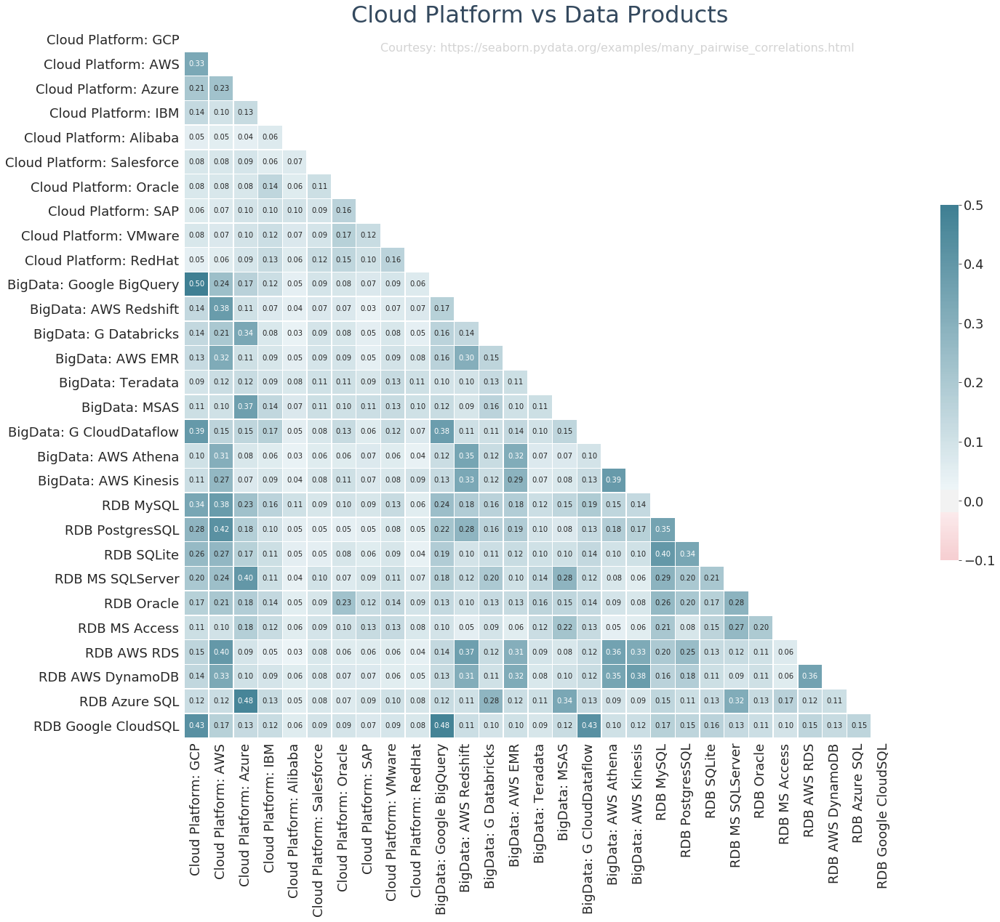

In [71]:
# Correlation Plot 3

label_size = 18
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(dfcorr3, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (22,18))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(dfcorr3, mask = mask, vmax = .5, vmin = -.1, center = 0,cmap=cmap,
           annot = True, square = True, linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("Cloud Platform vs Data Products", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 3'+'.png', bbox_inches = 'tight')


In [72]:
dfcorr = df[[ 'Cloud_Platform_GCP','Cloud_Platform_AWS','Cloud_Platform_Azure','Cloud_Platform_IBM',
              'Cloud_Platform_Alibaba','Cloud_Platform_Salesforce','Cloud_Platform_Oracle','Cloud_Platform_SAP',
              'Cloud_Platform_VMware','Cloud_Platform_RedHat',
              'ML_Product_SAS','ML_Product_Cloudera','ML_Product_Azure_Studio',
              'ML_Product_Google_Cloud_MLEngine','ML_Product_Google_Cloud_Vision','ML_Product_Google_SpeechtoText',
              'ML_Product_Google_Cloud_NaturalLanguage','ML_Product_Rapidminer','ML_Product_Google_Cloud_Translation',
              'ML_Product_AWS_Sagemaker',
              'AutoML_Google','AutoML_H2O','AutoML_Databricks','AutoML_DataRobot',
              'AutoML_Tpot','AutoML_Auto-Keras','AutoML_Auto-Sklearn','AutoML_Auto_ml','AutoML_Xcessiv','AutoML_MLbox'
]].copy()
             
dfcorr = dfcorr.rename(columns={'Cloud_Platform_GCP':'Cloud Platform: GCP','Cloud_Platform_AWS':'Cloud Platform: AWS',
                                'Cloud_Platform_Azure':'Cloud Platform: Azure','Cloud_Platform_IBM':'Cloud Platform: IBM',
                                'Cloud_Platform_Alibaba':'Cloud Platform: Alibaba',
                                'Cloud_Platform_Salesforce':'Cloud Platform: Salesforce',
                                'Cloud_Platform_Oracle':'Cloud Platform: Oracle','Cloud_Platform_SAP':'Cloud Platform: SAP',
                                'Cloud_Platform_VMware':'Cloud Platform: VMware','Cloud_Platform_RedHat':'Cloud Platform: RedHat',
                                'ML_Product_SAS':'ML SAS','ML_Product_Cloudera':'ML Cloudera',
                                'ML_Product_Azure_Studio':'ML Azure Studio',
                                'ML_Product_Google_Cloud_MLEngine':'ML G MLEngine',
                                'ML_Product_Google_Cloud_Vision':'ML G Cloud Vision',
                                'ML_Product_Google_SpeechtoText':'ML G SpeechtoText',
                                'ML_Product_Google_Cloud_NaturalLanguage':'ML G NaturalLanguage',
                                'ML_Product_Rapidminer':'ML Rapidminer',
                                'ML_Product_Google_Cloud_Translation':'ML G Cloud Tranlation',
                                'ML_Product_AWS_Sagemaker':'ML AWS Sagemaker',
                                'AutoML_Google':'AutoML Google','AutoML_H2O':'AutoML H2O',
                                'AutoML_Databricks':'AutoML Databricks','AutoML_DataRobot':'AutoML DataRobot',
                                'AutoML_Tpot':'AutoML Tpot','AutoML_Auto-Keras':'AutoML Auto-Keras',
                                'AutoML_Auto-Sklearn':'AutoML Auto-Sklearn','AutoML_Auto_ml':'AutoML Auto_ml',
                                'AutoML_Xcessiv':'AutoML Xcessiv','AutoML_MLbox':'AutoML MLbox'})

dfcorr4 = dfcorr.corr()

# <a>1.14 What are the relationships between preffered Cloud Platforms and ML Products?</a>

Text(0.5, 1.0, 'Cloud Platform vs Machine Learning Products')

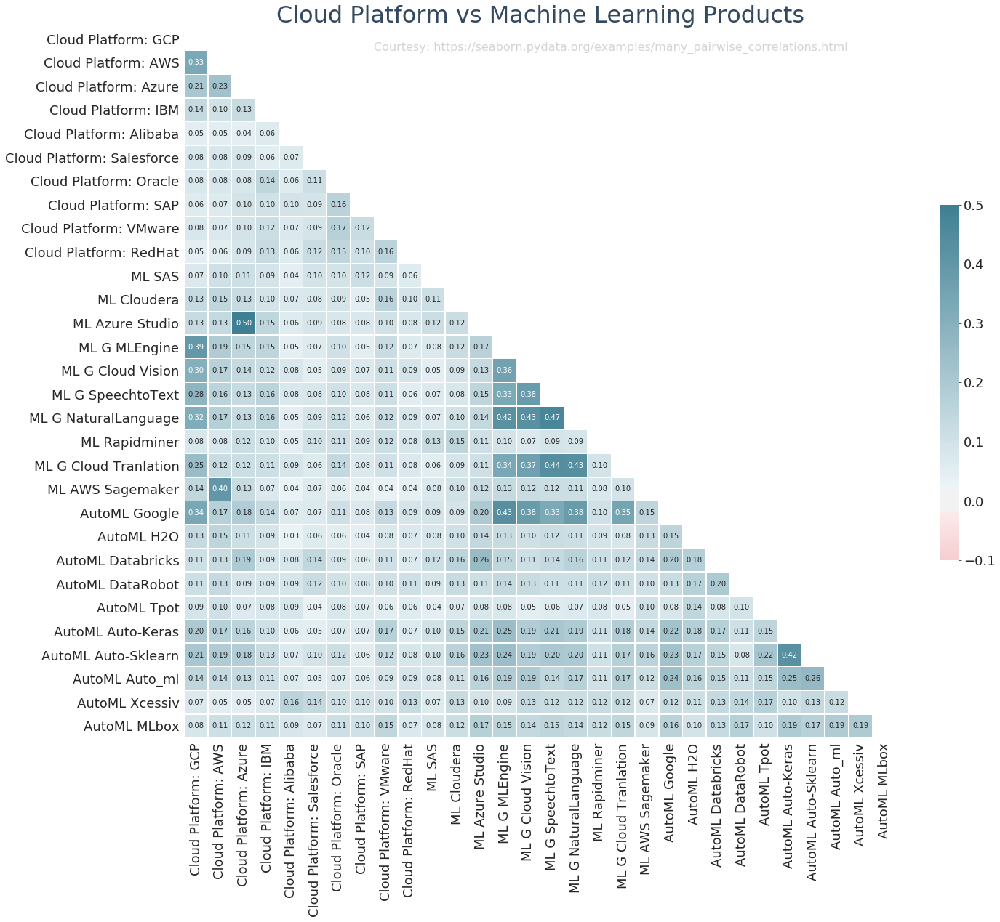

In [73]:
# Correlation Plot 4

label_size = 18
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(dfcorr4, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (22,18))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(dfcorr4, mask = mask, vmax = .5, vmin = -.1, center = 0,cmap=cmap,
           annot = True, square = True, linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("Cloud Platform vs Machine Learning Products", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 4'+'.png', bbox_inches = 'tight')


# <a>1.15 Analysis of Preffered Courses and ML</a>
#### <a>Summary Graphics is uploaded in </a>
https://www.kaggle.com/kathakaliseth/kaggle2019surveysalaryusandindia

<i>Summary is created with Pivot Table</i>

In [74]:
from IPython.display import Image
import os
!ls ../input/

kaggle-survey-2019  kaggle2019surveysalaryusandindia


## <a>1.15.1 Course Preference Summary</a>

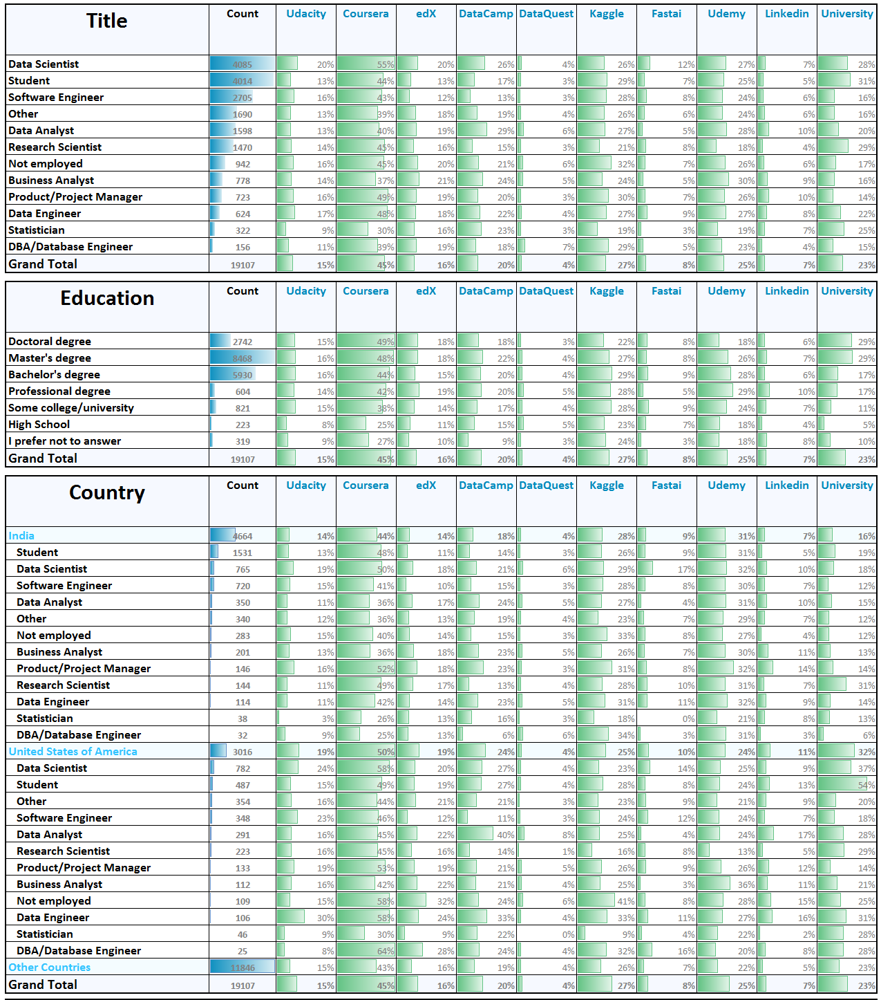

In [75]:
Image("../input/kaggle2019surveysalaryusandindia/Course Preference.png")

## <a>1.15.2 ML Algorithms and Techniques Summary</a>

### Please click on the image to zoom

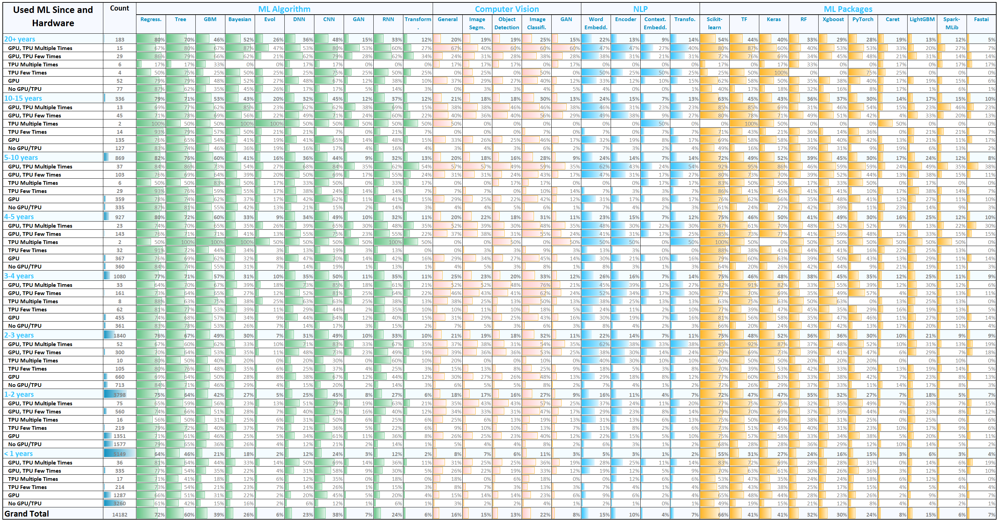

In [76]:
Image("../input/kaggle2019surveysalaryusandindia/ML Algorithms and Techniques used.png")

# <a><font color="#eeaa00">2. Salary in 2019</font></a>

# <a>2.1 US and India Salary Summary</a>

#### <a>US and India Salary Summary Data is uploaded in </a>
https://www.kaggle.com/kathakaliseth/kaggle2019surveysalaryusandindia

1. Plot Courtesy: http://corybrunson.github.io/ggalluvial/

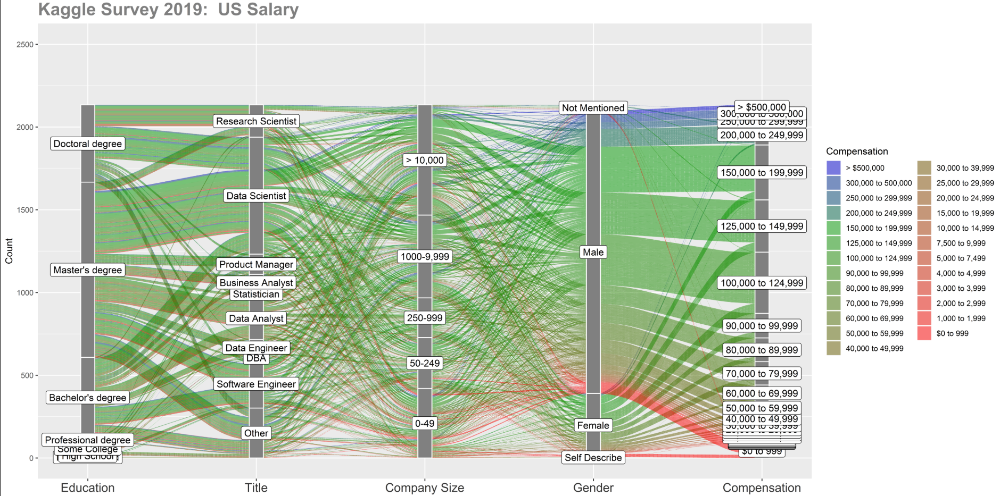

In [77]:
#us_salary_summary = pd.read_csv('../input/kaggle2019surveysalaryusandindia/us_salary_summary.csv')
Image("../input/kaggle2019surveysalaryusandindia/US Salary.png")

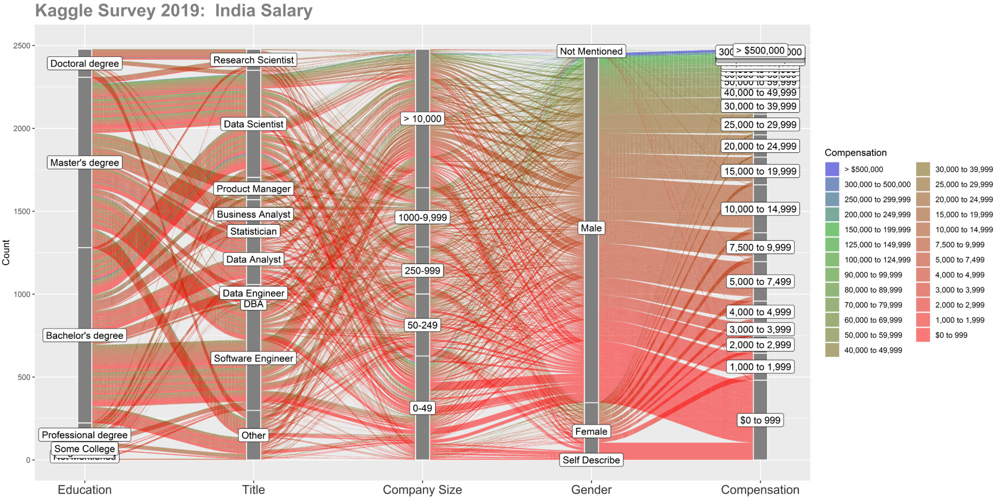

In [78]:
#india_salary_summary = pd.read_csv('../input/kaggle2019surveysalaryusandindia/india_salary_summary.csv')
Image("../input/kaggle2019surveysalaryusandindia/India Salary.png")

#### <a>Reading Encoded Salary Data from</a>

This is salary data and influencing factors with label encoding. Numeric ranges are replaced with mean values. Some ordinal values are converted to ordered numeric values.

https://www.kaggle.com/kathakaliseth/kaggle2019surveysalaryusandindia

In [79]:
salary = pd.read_csv('../input/kaggle2019surveysalaryusandindia/encoded_salary_data.csv')
print('Shape :', salary.shape)
salary.head(2)

Shape : (12463, 49)


,Compensatio,Doctoral degree,Masters degree,Bachelors degree,Professional degree,Some College,High School,Education Not Mentioned,Research Scientist,Data Scientist,Product Manager,Business Analyst,Statistician,Data Analyst,Data Engineer,DBA,Software Engineer,Other Roles,Company Size,ML Maturity,DS Team,ML Money Spent,Used ML,Coding Experience,Advanced statistical software,Cloud-based Data Analysis,Basic statistical software,Business intelligence software,Local Data Analysis,Other Data Analysis,Role Data Analysis,Role Build Data Infra,Role_BuildPrototype,Role Build ML,Role Experiment ML,Role Research ML,Python,R,SQL,C,C++,Java,Javascript,TypeScript,Bash,MATLAB,Education,Job Title,Data Analysis Tool
0,600000,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,5500,0,30.0,55000,4.5,15.0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,Doctoral degree,Research Scientist,Local Data Analysis
1,600000,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,25,4,30.0,5500,0.0,1.5,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Doctoral degree,Research Scientist,Cloud-based Data Analysis


# <a>2.2. Aspiring Data Scientists - see how the salary varies?</a>

There are various factors that influence salary, but some of them are rather fixed OR we might not want to change them, like:<font color="#eeaa00">
* Gender
* Country
* Age etc.</font>

But we can choose or change others, like:<font color="#eeaa00">
* Company
* How much we spend to acquire ML skill
* ML Maturity level at the company you choose
* Choice of Data Analytics tool</font>

Let's explore and concentrate on these factors that are actionable as we can choose or change them.

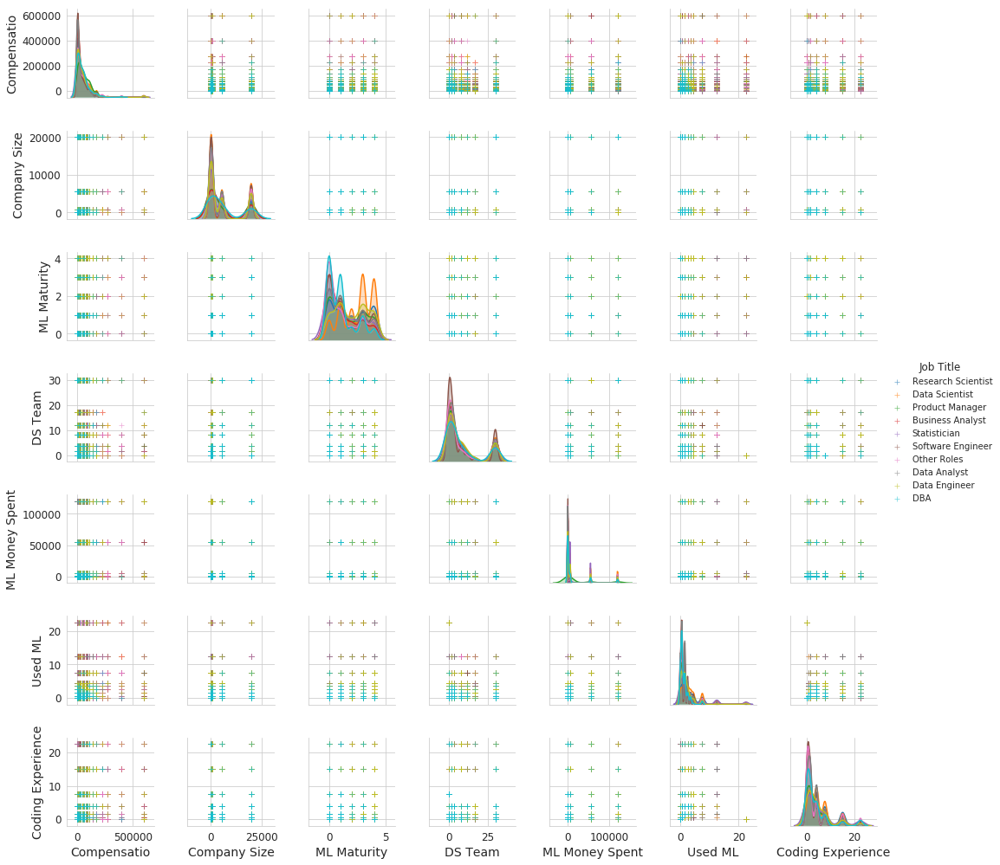

In [80]:
sns.set_style("whitegrid")

label_size = 12
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size
mpl.rcParams['axes.labelsize'] = 14

#plt.figure(figsize=(8,8))
columns = ['Compensatio','Company Size','ML Maturity','DS Team','ML Money Spent','Used ML','Coding Experience','Job Title']
sns.pairplot(salary[columns],size = 2,diag_kind='kde',markers="+",hue='Job Title',palette="tab10",
            plot_kws = {'alpha': 0.6,'s': 36,'edgecolor': 'k'})
#plt.legend(fontsize=14,title_fontsize=18)
#plt.suptitle('Salary Correlation with Company and Experience \n\n',size = 28,color='#34495E',alpha=0.8)
#plt.title("Salary Correlation with Company and Experience", loc="center",size=18,color='#34495E',alpha=0.6)
plt.show()

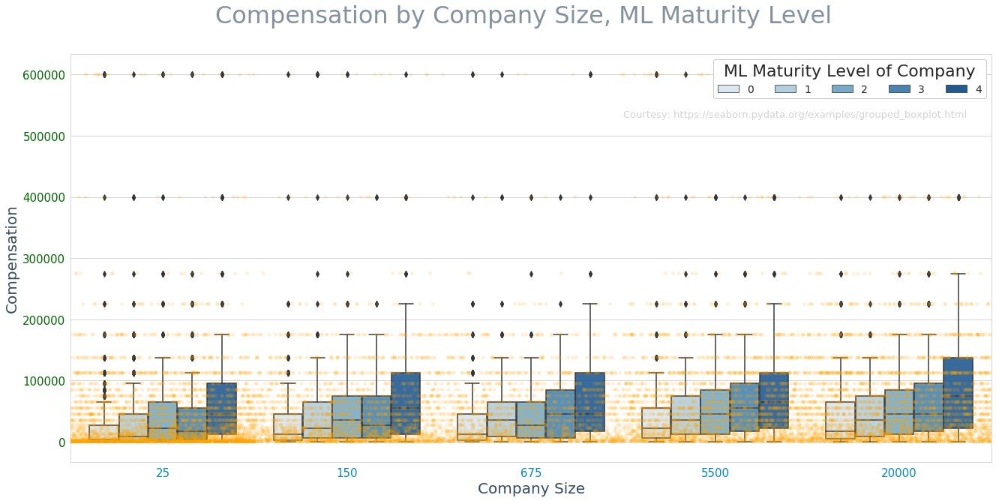

In [81]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Company Size", y="Compensatio", data=salary, hue='ML Maturity',color='#eeeeee', palette="Blues")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Company Size', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Company Size, ML Maturity Level  \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('Company Size',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)  
plt.yticks(size=15,color='#006600')
plt.text(2.5, 530000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
#plt.ylim(0,200)
plt.legend(loc="upper right",fontsize=14,ncol=5,title='ML Maturity Level of Company',title_fontsize=22,framealpha=0.99)
plt.show()

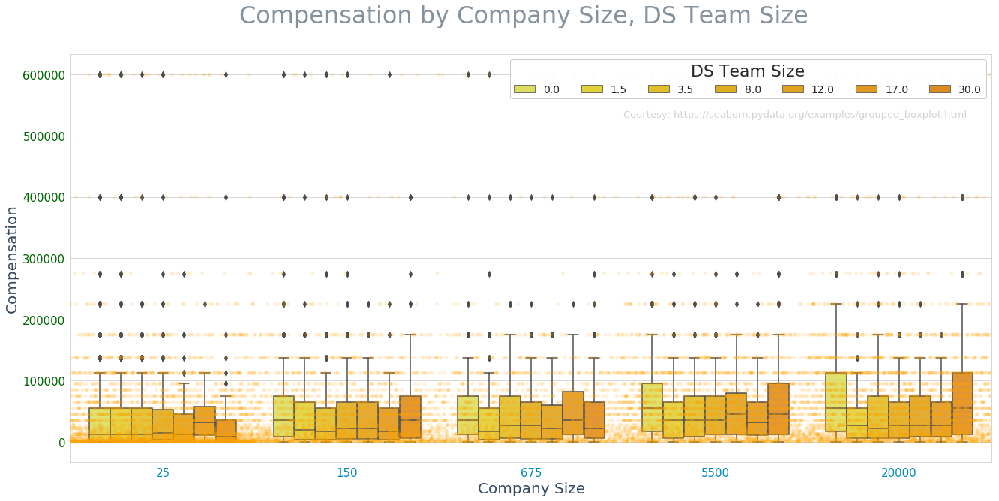

In [82]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Company Size", y="Compensatio", data=salary, hue='DS Team',color='#eeeeee', palette="Wistia")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Company Size', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Company Size, DS Team Size  \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('Company Size',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)  
plt.yticks(size=15,color='#006600')
#plt.ylim(0,200)
plt.text(2.5, 530000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
plt.legend(loc="upper right",fontsize=14,ncol=7,title='DS Team Size',title_fontsize=22,framealpha=0.99)
plt.show()

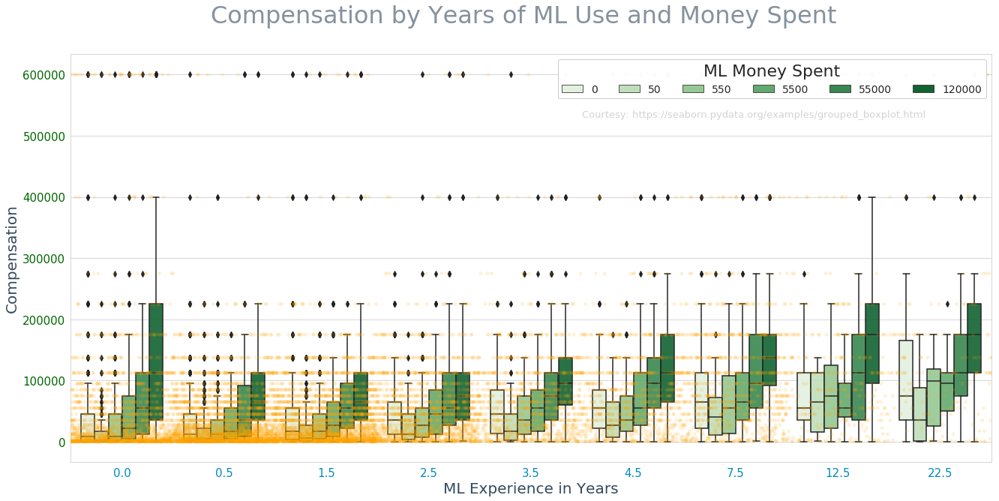

In [83]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Used ML", y="Compensatio", data=salary, hue='ML Money Spent',color='#666666', palette="Greens")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Used ML', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Years of ML Use and Money Spent  \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('ML Experience in Years',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=15,color='#006600')
#plt.ylim(0,200)
plt.text(4.5, 530000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
plt.legend(loc="upper right",fontsize=14,ncol=7,title='ML Money Spent',title_fontsize=22,framealpha=0.99)
plt.show()

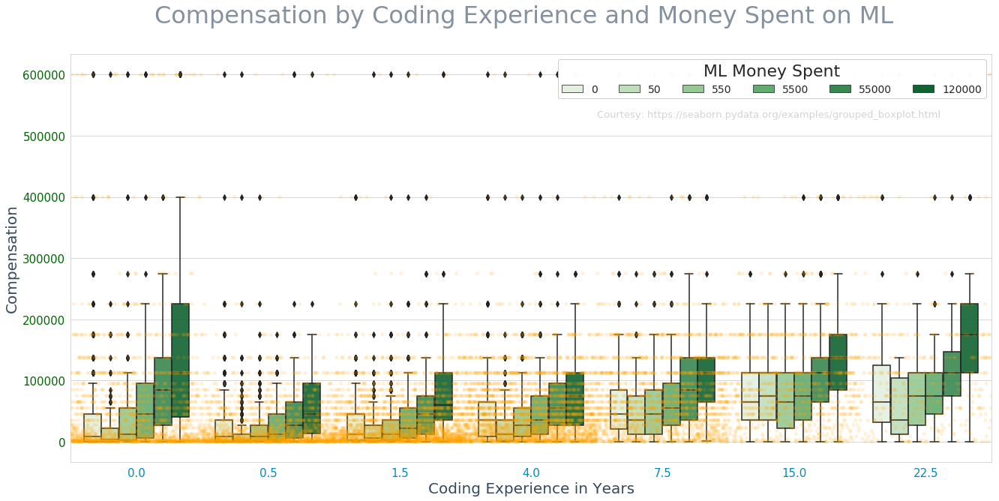

In [84]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Coding Experience", y="Compensatio", data=salary, hue='ML Money Spent',color='#666666', palette="Greens")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Coding Experience', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Coding Experience and Money Spent on ML  \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('Coding Experience in Years',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=15,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=15,color='#006600')
#plt.ylim(0,200)
plt.text(3.5, 530000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
plt.legend(loc="upper right",fontsize=14,ncol=7,title='ML Money Spent',title_fontsize=22,framealpha=0.99)
plt.show()

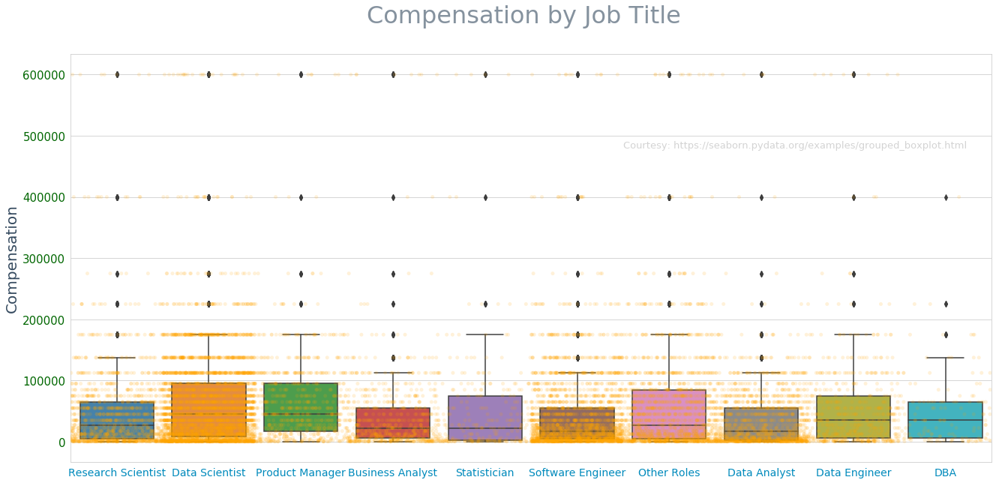

In [85]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Job Title", y="Compensatio",data=salary,color='#666666', palette="tab10")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Job Title', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Job Title  \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=14,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=15,color='#006600')
#plt.ylim(0,200)
plt.text(5.5, 480000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
#plt.legend(loc="upper right",fontsize=14,ncol=3,title='Job Title',title_fontsize=22,framealpha=0.99)
plt.show()

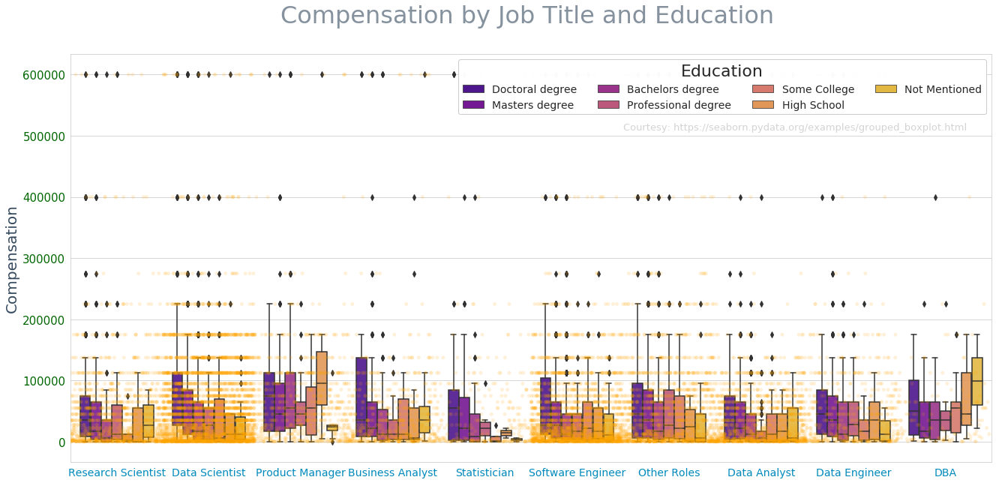

In [86]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Job Title", y="Compensatio", data=salary,hue="Education",color='#666666', palette="plasma")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Job Title', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Job Title and Education \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=14,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=15,color='#006600')
#plt.ylim(0,200)
plt.text(5.5, 510000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
plt.legend(loc="upper right",fontsize=14,ncol=4,title='Education',title_fontsize=22,framealpha=0.99)
plt.show()

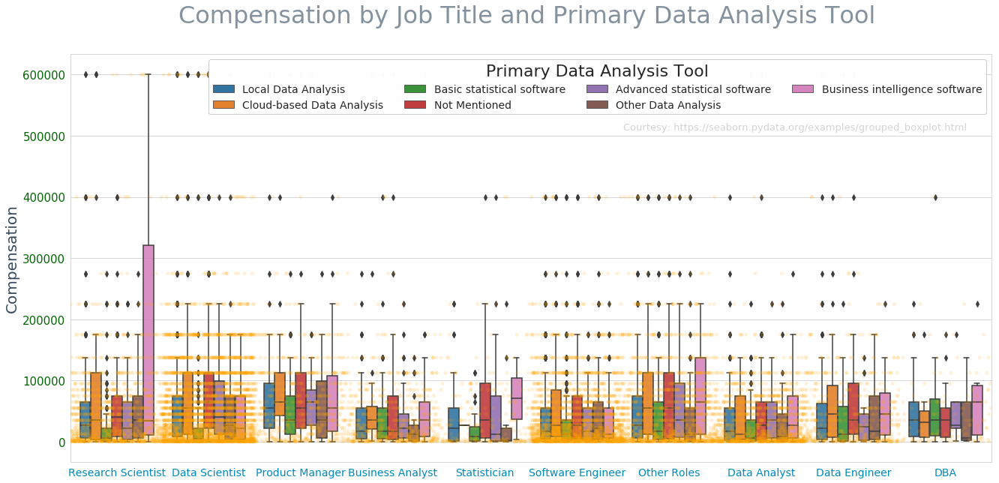

In [87]:
sns.set_style("whitegrid")
plt.figure(figsize=(22,10))

ax = sns.boxplot(x="Job Title", y="Compensatio", data=salary,hue="Data Analysis Tool",color='#666666', palette="tab10")

# Add transparency to colors
for patch in ax.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .9))
    
ax = sns.stripplot(x='Job Title', y='Compensatio', data=salary, color="orange", jitter=0.5, size=5,alpha=0.15)

plt.title("Compensation by Job Title and Primary Data Analysis Tool \n", loc="center",size=32,color='#34495E',alpha=0.6)
plt.xlabel('',color='#34495E',fontsize=20) 
plt.ylabel('Compensation',color='#34495E',fontsize=20)
plt.xticks(size=14,color='#008abc',rotation='horizontal', wrap=True)
plt.yticks(size=15,color='#006600')
#plt.ylim(0,500000)
plt.text(5.5, 510000, 'Courtesy: https://seaborn.pydata.org/examples/grouped_boxplot.html', fontsize=13,alpha=0.2)
plt.legend(loc="upper right",fontsize=14,ncol=4,title='Primary Data Analysis Tool',title_fontsize=22,framealpha=0.99)
plt.show()

# <a>2.3. Salary Corelation with Actionable Factors</a>

In [88]:
def num_scaling(num_var):
    """ Function to scale numeric variables """
    scaler = MinMaxScaler()
    num_var = num_var.fillna(0)
    num_var = scaler.fit_transform(num_var)
    #print(num_var.max())
    return num_var

#for i in range(len( salary.columns)):
for i in range(46):        
    var = salary.columns[i]
    #print(var)
    salary[[var]]   = num_scaling(salary[[var]])  
    
salary_corr1 = salary[salary.columns[0:24]].corr()
salary_corr2 = salary[['Compensatio','Advanced statistical software','Cloud-based Data Analysis','Basic statistical software',
                       'Business intelligence software','Local Data Analysis','Other Data Analysis','Role Data Analysis',
                       'Role Build Data Infra','Role_BuildPrototype','Role Build ML','Role Experiment ML',
                       'Role Research ML','Python','R','SQL','C','C++','Java','Javascript',
                       'TypeScript','Bash','MATLAB']] .corr()

Text(0.5, 1.0, 'Compensation and your Profile')

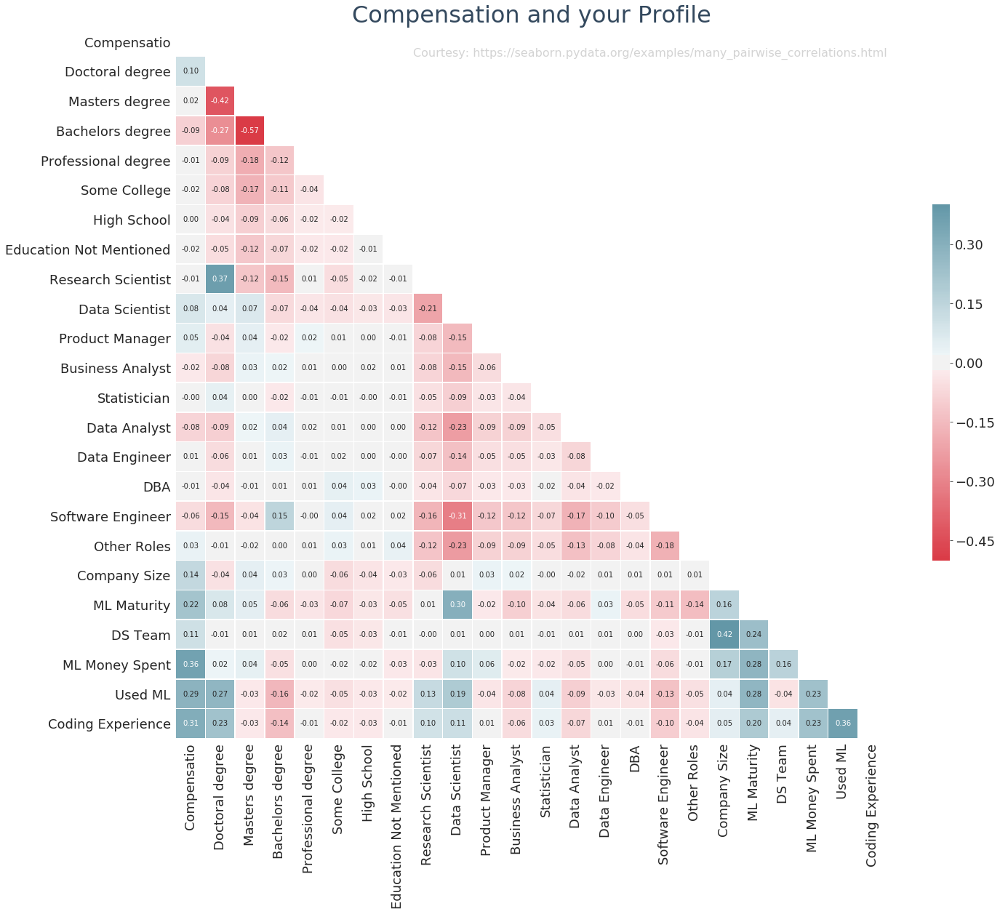

In [89]:
# Correlation Plot 5

label_size = 18
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(salary_corr1, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (22,18))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(salary_corr1, mask = mask, vmax = .4, vmin = -.5, center = 0,cmap=cmap,
           annot = True, square = True, linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("Compensation and your Profile", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 5'+'.png', bbox_inches = 'tight')

## <a>Insights</a>

You cannot change much on coding experience or how long you are using ML, but definitely can look at these:<font color="#67BF5C"><b>
* Size of the Company you work
* Size of DS Team
* ML Maturity Level at your company</b></font>

And<font color="#67BF5C"><b>
* Money Spent on ML</b></font>
But this could be a correlation (not causation) that participants at higher income level have spent more on ML.

Also these people earn more:<font color="#67BF5C"><b>
* With Doctoral Degree
* Data Scientist
* Product Manager
* Other Managerial/Executive Roles
* With Longer Years of ML and Coding Experience</b></font>


Text(0.5, 1.0, 'Compensation and your Work')

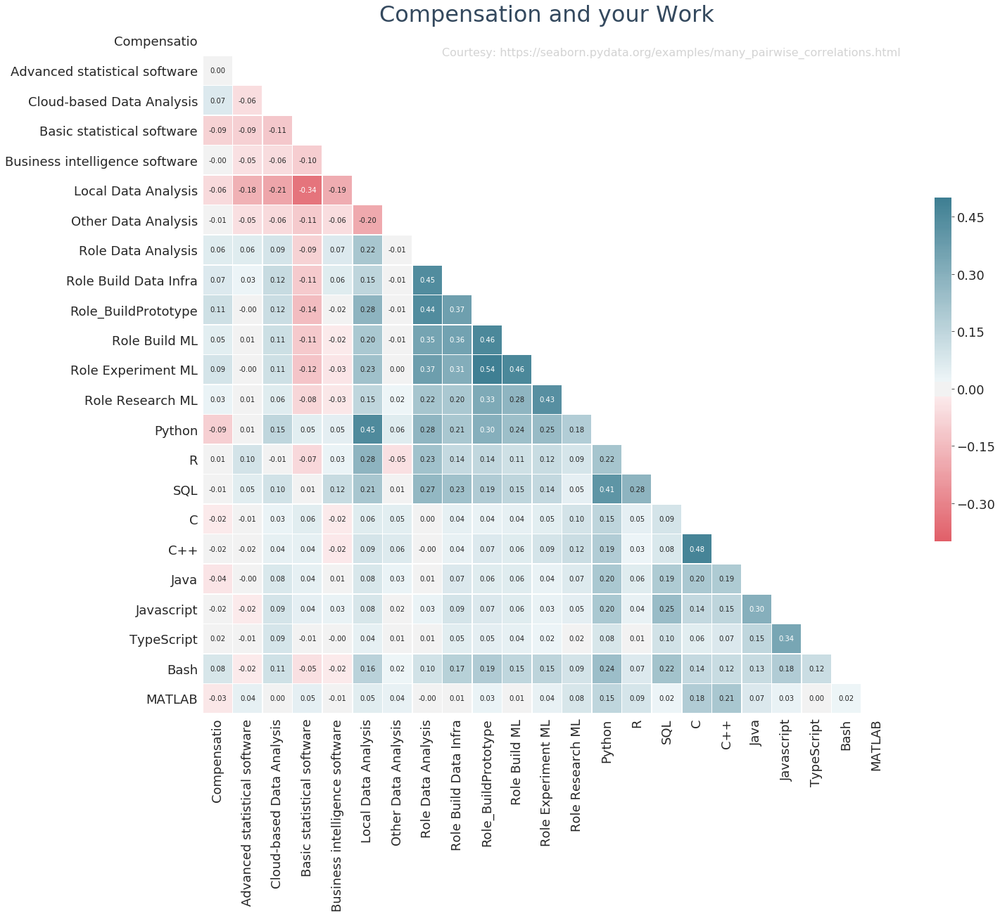

In [90]:
# Correlation Plot 6

label_size = 18
mpl.rcParams['xtick.labelsize'] = label_size
mpl.rcParams['ytick.labelsize'] = label_size

sns.set_style("whitegrid")
mask = np.zeros_like(salary_corr2, dtype = np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (22,18))

cmap = sns.diverging_palette(10,220, as_cmap = True)  #10,133

#Draw
sns.heatmap(salary_corr2, mask = mask, vmax = .5, vmin = -.4, center = 0,cmap=cmap,
           annot = True, square = True, linewidth = .5, cbar_kws = {'shrink':.5}, fmt= '.2f')
plt.text(8, 1, 'Courtesy: https://seaborn.pydata.org/examples/many_pairwise_correlations.html', fontsize=16,alpha=0.2)
plt.title("Compensation and your Work", loc = 'center', size = 32, color = '#34495E')
#plt.savefig('Survey Data Correlation Matrix 6'+'.png', bbox_inches = 'tight')

Factors that influence more compensation are:<font color="#67BF5C"><b>
* Usage of Cloud based Data Analysis
* More involvement in Data Analysis, Engineering and ML work
* Usage of BI Software (people at executive level)</b></font>

And<font color="#67BF5C"><b>
* Compensation's negative correlation with Pyton</b></font>
can simply mean more yongsters are taking up Python and Python is not causing less compensation.

# <a><font color="#eeaa00">3. Salary Predictor</font></a>

# <a>3.1 Salary Prediction Model</a>

# WIP

# <a>3.2 Enter your profile data to know likely Salary</a>
### If you have not participated in the Survey

In [91]:
questions

,Time from Start to Finish (seconds),Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Q12,Q13,Q14,Q15,Q16,Q17,Q18,Q19,Q20,Q21,Q22,Q23,Q24,Q25,Q26,Q27,Q28,Q29,Q30,Q31,Q32,Q33,Q34
0,Duration (in seconds),What is your age (# years)?,What is your gender? - Selected Choice,In which country do you currently reside?,What is the highest level of formal education ...,Select the title most similar to your current ...,What is the size of the company where you are ...,Approximately how many individuals are respons...,Does your current employer incorporate machine...,Select any activities that make up an importan...,What is your current yearly compensation (appr...,Approximately how much money have you spent on...,Who/what are your favorite media sources that ...,On which platforms have you begun or completed...,What is the primary tool that you use at work ...,How long have you been writing code to analyze...,Which of the following integrated development ...,Which of the following hosted notebook product...,What programming languages do you use on a reg...,What programming language would you recommend ...,What data visualization libraries or tools do ...,Which types of specialized hardware do you use...,Have you ever used a TPU (tensor processing un...,For how many years have you used machine learn...,Which of the following ML algorithms do you us...,Which categories of ML tools do you use on a r...,Which categories of computer vision methods do...,Which of the following natural language proces...,Which of the following machine learning framew...,Which of the following cloud computing platfor...,Which specific cloud computing products do you...,Which specific big data / analytics products d...,Which of the following machine learning produc...,Which automated machine learning tools (or par...,Which of the following relational database pro...


In [92]:
answer_1     =  ''
answer_2     =  ''
answer_3     =  ''
answer_4     =  ''
answer_5     =  ''
answer_6     =  ''
answer_7     =  ''
answer_8     =  ''
answer_9     =  ''

## Etc.

In [93]:
#Likely_Salary_Range =